In [1]:
import os
import pandas as pd
import numpy as np
import json 

import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib_scalebar.scalebar import ScaleBar
import seaborn as sns

from neuron_morphology.swc_io import morphology_from_swc
from neuron_morphology.constants import AXON
from morph_utils.visuals import basic_morph_plot
from morph_utils.measurements import leftextent, rightextent 
from morph_utils.templates import load_layer_template

from scipy.stats import kde, kruskal
from statsmodels.stats.multitest import fdrcorrection
from scikit_posthocs import posthoc_dunn
from statannotations.Annotator import Annotator

import random
import warnings
import operator

import pickle

import sys 
sys.path.append(r'..\utils') 
from utils import add_swc_paths, get_seaad_colors, get_tx_order, format_box_plot, AVERAGE_DISTANCE_BETWEEN_NODES

In [2]:
#HANN mapping
class_col = 'class_label_Hierarchical'
subclass_col = 'subclass_label_Hierarchical'
cluster_col = 'cluster_label_Hierarchical'


In [3]:
#load data

data_root = r'\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\data\Features\axon'
output_dir = r'\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\analysis\20251201_seaad\axon'
layer_aligned_dir = r'\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\data\SWC_LayerAligned' #path to folder with layer aligned swcs for these cells 

os.makedirs(output_dir, exist_ok=True)

metadata = pd.read_csv(os.path.join(data_root, 'metadata.csv'))
aligned_histogram = pd.read_csv(os.path.join(data_root, 'AlignedHistogram.csv'))
aligned_soma_depths = pd.read_csv(os.path.join(data_root, 'AlignedSomaDepths.csv'))
raw_feature_wide = pd.read_csv(os.path.join(data_root, 'RawFeatureWide.csv'))

#Get L2 L3 ttype split
with open(r"\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\data\formatting_dicts\ttype_layer_dict.json", "r") as f:
    ttype_to_layer_dict = json.load(f)

with open(r"\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\data\formatting_dicts\L23_ttype_rename.json", "r") as f:
    L23_ttype_rename_dict = json.load(f)

species = 'human'
layer_info, layer_labels, layer_colors = load_layer_template(species)

#Get color dicts
color_dict = get_seaad_colors()
with open(r"\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\data\colors\layer_colors.json", "r") as f: layer_color_dict = json.load(f)
with open(r"\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\data\colors\lobe_colors.json", "r") as f: lobe_color_dict = json.load(f)
with open(r"\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\data\colors\paradigm_colors.json", "r") as f: paradigm_color_dict = json.load(f)
color_dicts = {
    't_type' : color_dict, 
    'subclass_label' : color_dict, 
    'lobe' : lobe_color_dict, 
    'lobe_group' : lobe_color_dict,
    'paradigm' : paradigm_color_dict,
    'layer' : layer_color_dict  
}

In [4]:
#data wrangling

#combine data and get la file paths 
metadata = metadata.rename(columns={"cell_id": "specimen_id", cluster_col: "t_type", subclass_col:'subclass_label'})#, "Pinned Structure and Layer": "final_structure"})
metadata = metadata[['specimen_id', 't_type', 'subclass_label', 'lobe', 'paradigm']] #, 'seuratQCpass'
metadata['lobe_group'] = metadata['lobe'].apply(lambda x: x if x == 'TemL' else 'Other')

#remove vals without a seaad mapping
metadata['t_type'] = metadata['t_type'].fillna('TBD')
metadata['subclass_label'] = metadata['subclass_label'].fillna('TBD')

#massage metadata
metadata['subclass_label'] = metadata['subclass_label'].replace('L5 ET_ME', 'L5 ET')
metadata['t_type'] = metadata['t_type'].replace('L5 ET_ME', 'L5 ET(ME)')
metadata['t_type'] = metadata['t_type'].apply(lambda x: L23_ttype_rename_dict.get(x, x))
metadata['layer'] = metadata["t_type"].map(ttype_to_layer_dict)

#add soma depths and features
data = metadata.merge(aligned_soma_depths, how='inner', on='specimen_id')
data = add_swc_paths(data, layer_aligned_dir, column_name='SWC_layer_aligned')
data = data.merge(raw_feature_wide, how='inner', on='specimen_id') 

#sort the cells
sorted_data = data.sort_values(by=['t_type', 'soma_distance_from_pia'])

#delete columns where any vals are nan
sorted_clean_data = sorted_data.dropna(axis=1, how='all')


In [5]:
#Get custom transcriptomic order
ttype_order, subclass_order = get_tx_order()
group_order = {
    'subclass_label' : subclass_order,
    't_type' :  ttype_order, 
    'layer' : ['Layer 2', 'Layer 3', 'Layer 4', 'Layer 5', 'Layer 6']
}

Cell viewer

In [1]:
# plot a groups of cells 

group_var = 't_type'
group_color_dict = color_dict #colors for group_var

intra_group_sort = ['soma_distance_from_pia'] #within a group, what to sort by
fig_path = os.path.join(output_dir, 'human_excitatory_row_viewer_axon_byTtype_bySomaDepth.pdf')
cell_title =True

##########################################

#get set of all groups (e.g. ttypes)
all_groups = group_order[group_var]

#which neuron compartments to plot 
compartment_list=[1,2] # node types to plot i.e. [soma, axon, basal, apical] 

#formatting text 
group_title_font_size = 20
group_title_start_height = 400 #starting height for group (e.g., region) title 
layer_label_font_size = 12
cell_title_start_height = 30 #starting height for cell title 
cell_title_y_buffer = 100

with PdfPages(fig_path) as pdf:
    with warnings.catch_warnings():
        warnings.simplefilter(action='ignore', category=FutureWarning)
        
        iz = 0
        for group in all_groups:
            print('{} : {}'.format(iz, group)); iz+=1
            #get group data 
            group_data = sorted_clean_data[sorted_clean_data[group_var] == group]
            group_data = group_data.sort_values(by=intra_group_sort) #sort this group of data 

            cuttoff = 5
            if len(group_data) > cuttoff:
                fig, axes = plt.subplots(nrows=1,ncols=1,sharey=True, figsize=(len(group_data),len(group_data))) 
            else:
                factor = (cuttoff+2)-len(group_data)
                scaled_size = factor * len(group_data)
                fig, axes = plt.subplots(nrows=1,ncols=1,sharey=True, figsize=(scaled_size,scaled_size)) 

            ax = axes

            ax.get_yaxis().set_visible(False)
            sns.despine(left=True, bottom=True)

            ax.axis('off')
            xloc = 0
            xoffset = 0
            ax.set_anchor('W')
            ax.axhline(0, c="lightgrey",linewidth=0.50)
            buffer = 400

            for l in layer_info:
                ax.axhline(-layer_info[l], c=layer_colors[l],linewidth=0.50)
            for l in layer_labels:
                ax.text(-500,-layer_labels[l], "{}".format(l),verticalalignment='center', horizontalalignment='left',fontsize=layer_label_font_size, color='lightgrey') 
            
            #colors for ttype
            hex_color = group_color_dict[group][1:]
            contrast_level = 0.45
            lighter_color_rgb = tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))
            darker_color_rgb = tuple([int((contrast_level*x)) for x in lighter_color_rgb])
            grey_hex = '#8f8f8f'
            dark_hex = '#%02x%02x%02x' % darker_color_rgb
            hex_color = '#'+hex_color

            cell_type_colors_dict = {3: grey_hex, 4: grey_hex, 2: hex_color}
            # only show colors we specified in compartment_list
            morph_colors = {k:v for k,v in cell_type_colors_dict.items() if k in compartment_list}

            #title for group (i.e., ttype)
            ax.text(-500,group_title_start_height,
                "{} (n={}) ".format(group,len(group_data)),
                horizontalalignment='left',fontsize=group_title_font_size, color=hex_color) 

            #plot all the cells in this ttype 
            soma_depths_y = []
            i=-1
            for idx, row in group_data.iterrows():
                i+=1

                #get the cell 
                sp = sorted_clean_data.specimen_id[idx]
                swc_pth = sorted_clean_data.SWC_layer_aligned[sorted_clean_data.specimen_id == sp].iloc[0]
                nrn = morphology_from_swc(swc_pth)

                #save soma depth for plotting with histograms
                soma_depths_y.append(nrn.get_soma()['y'])

                #plot cell offset along the x axis from the previous cell 
                xoffset += leftextent(nrn,compartment_list)
                basic_morph_plot(nrn, ax=ax, xoffset=xoffset, morph_colors=morph_colors, scatter_roots = False, scatter_soma = False, plot_soma = True)

                # plot cell title
                if cell_title:
                    # text = sorted_clean_data.final_structure[sorted_clean_data.specimen_id == sp].iloc[0]
                    text2 = sorted_clean_data.specimen_id[sorted_clean_data.specimen_id == sp].iloc[0]
                    ax.text(xoffset, cell_title_start_height,text2,horizontalalignment='center',fontsize=4, color="dimgrey")
                    # ax.text(xoffset, cell_title_start_height+cell_title_y_buffer,text,horizontalalignment='center',fontsize=6, color="dimgrey")

                xoffset += rightextent(nrn,compartment_list)
                xoffset += buffer

                if i == 0:
                    #add a scale bar 
                    scalebar = ScaleBar(1, "um", location='lower right', frameon=False, length_fraction=0.05, color = 'grey')
                    ax.add_artist(scalebar)

                ax.set_aspect("equal") #so neurons don't look squised 
            
            # save the current figure
            pdf.savefig(fig, bbox_inches='tight')
            if iz == 1: plt.show() #show the first fig
            plt.clf() #destoy current fig to save memory



NameError: name 'color_dict' is not defined

Cell compartment histograms

0 : L2 IT_6


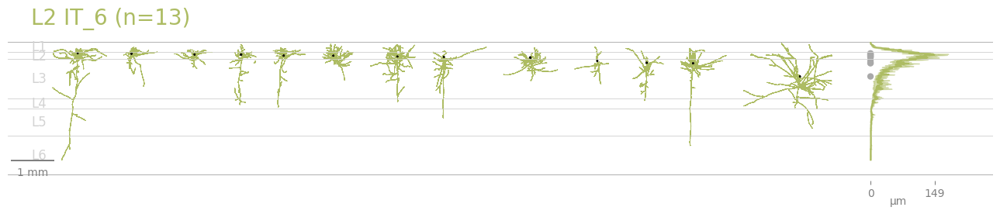

1 : L2 IT_1


<Figure size 640x480 with 0 Axes>

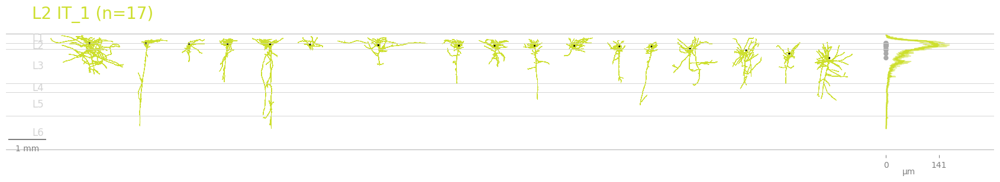

2 : L2 IT_7


<Figure size 640x480 with 0 Axes>

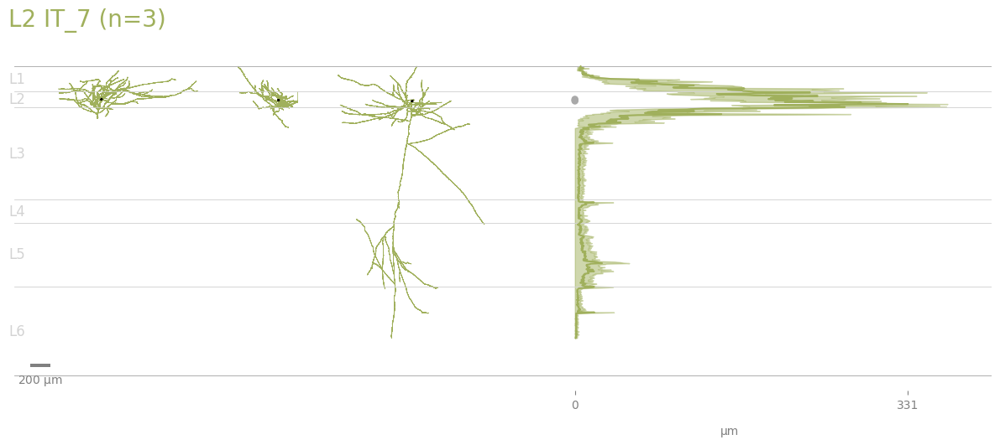

3 : L2 IT_2


<Figure size 640x480 with 0 Axes>

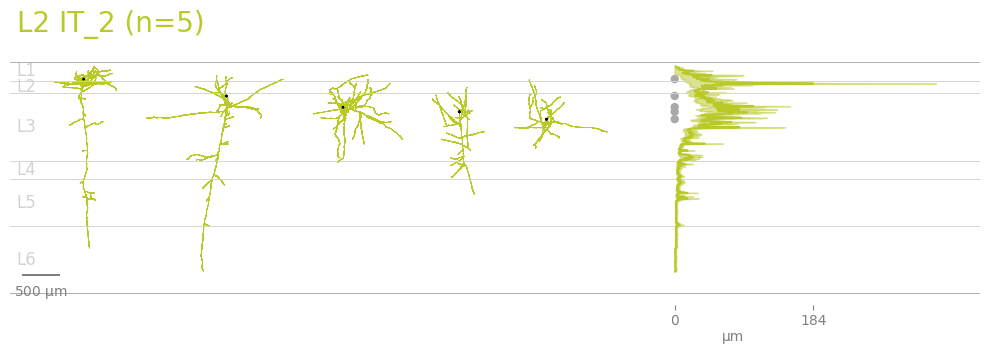

4 : L3 IT_8


<Figure size 640x480 with 0 Axes>

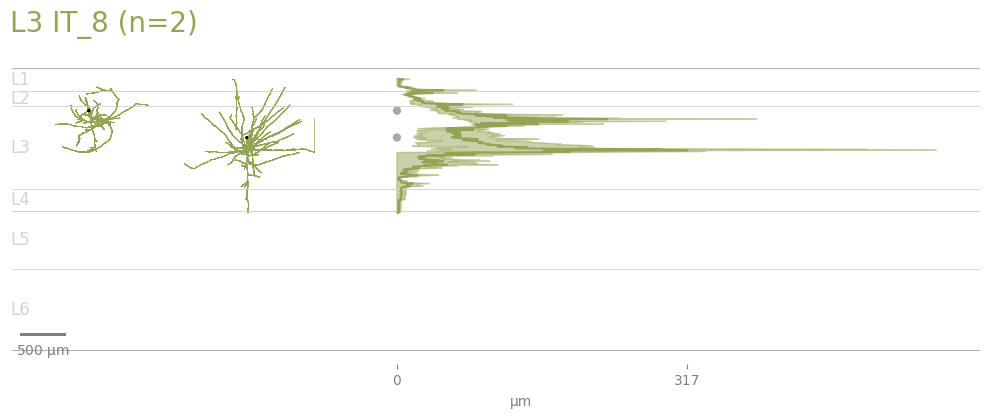

5 : L3 IT_12


<Figure size 640x480 with 0 Axes>

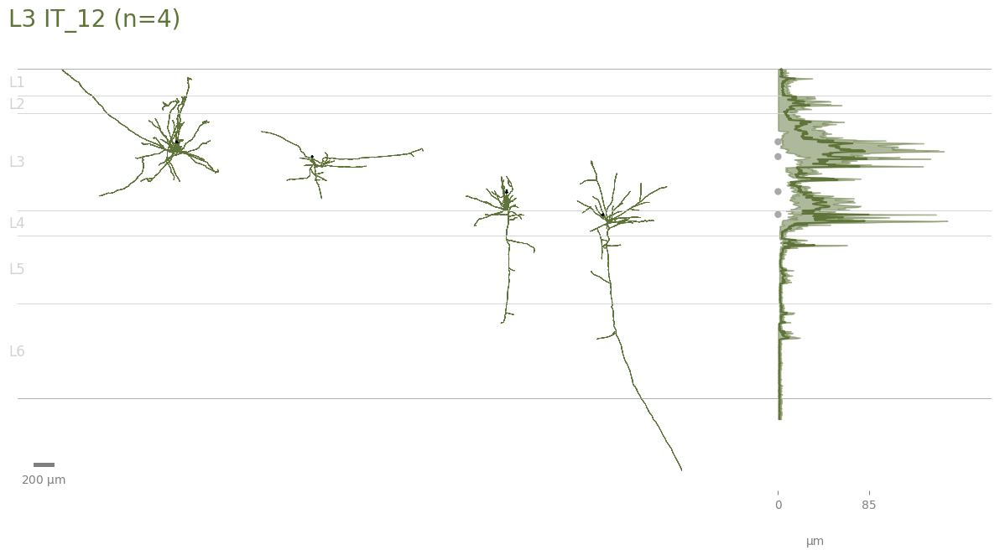

6 : L3 IT_10


<Figure size 640x480 with 0 Axes>

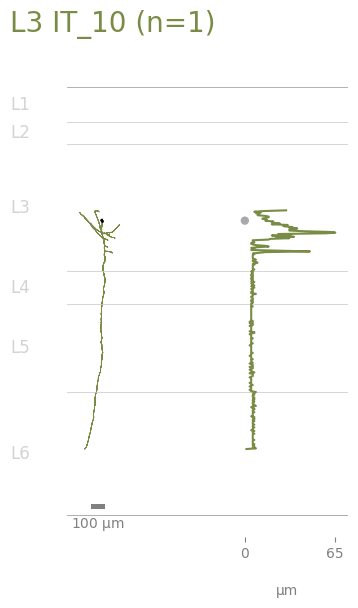

7 : L3 IT_13


<Figure size 640x480 with 0 Axes>

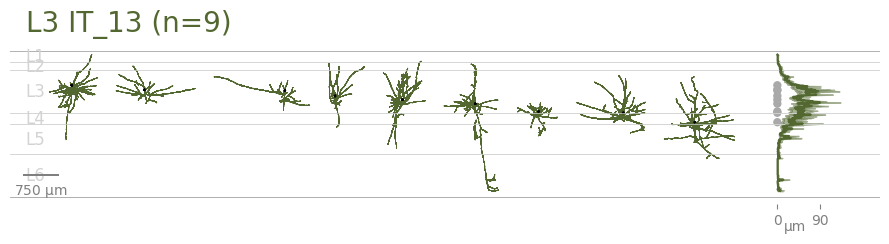

8 : L3 IT_5


<Figure size 640x480 with 0 Axes>

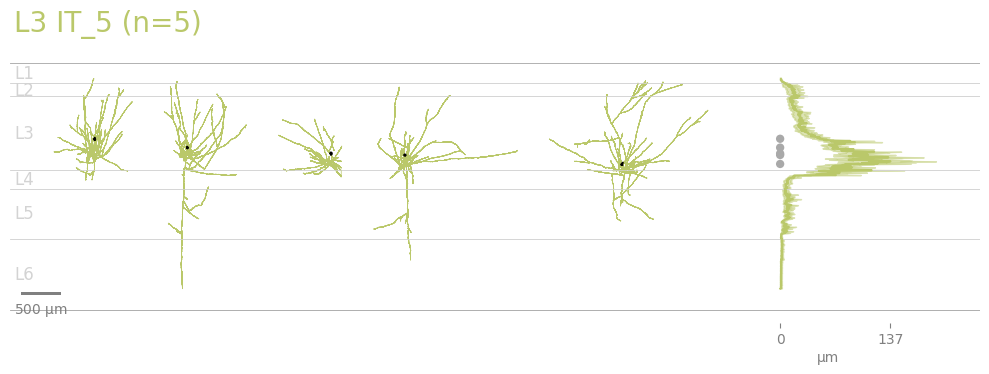

9 : L3 IT_3


<Figure size 640x480 with 0 Axes>

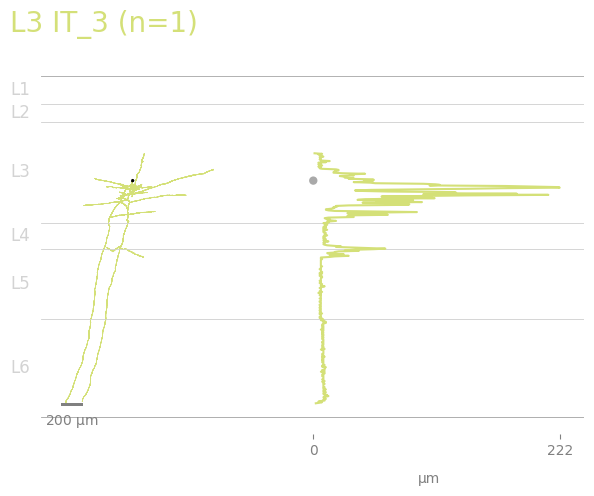

10 : L4 IT_3


<Figure size 640x480 with 0 Axes>

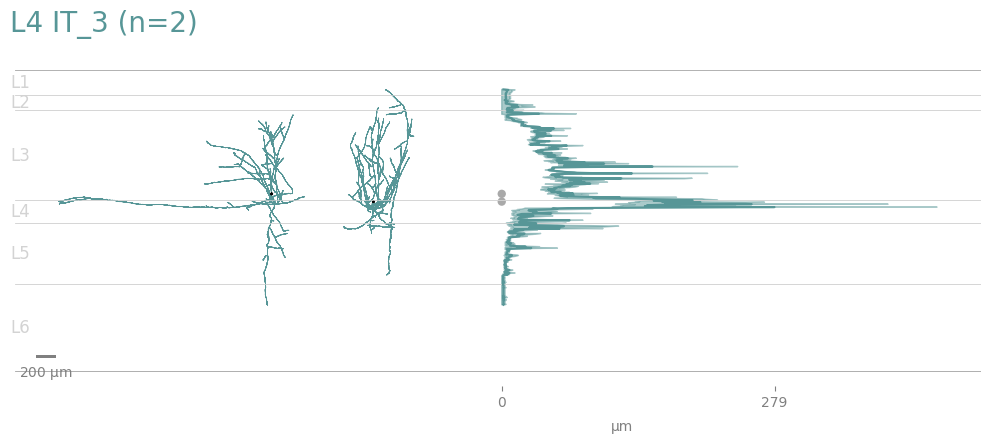

11 : L4 IT_4


<Figure size 640x480 with 0 Axes>

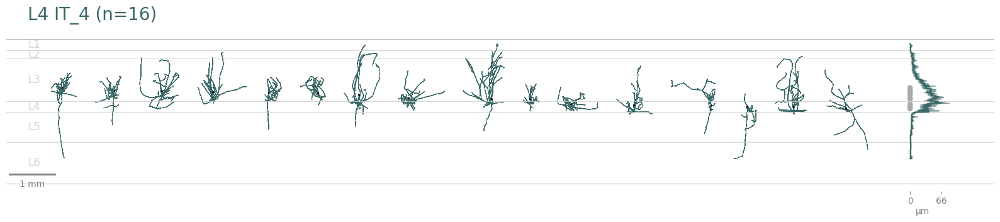

12 : L4 IT_2


<Figure size 640x480 with 0 Axes>

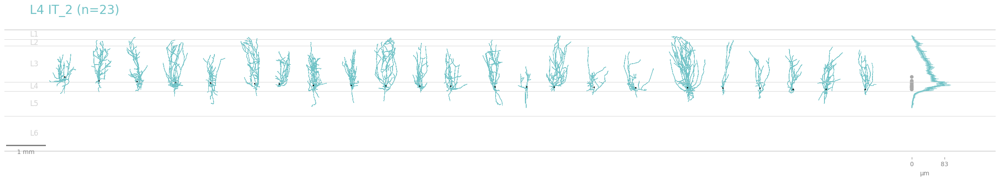

13 : L4 IT_1


<Figure size 640x480 with 0 Axes>

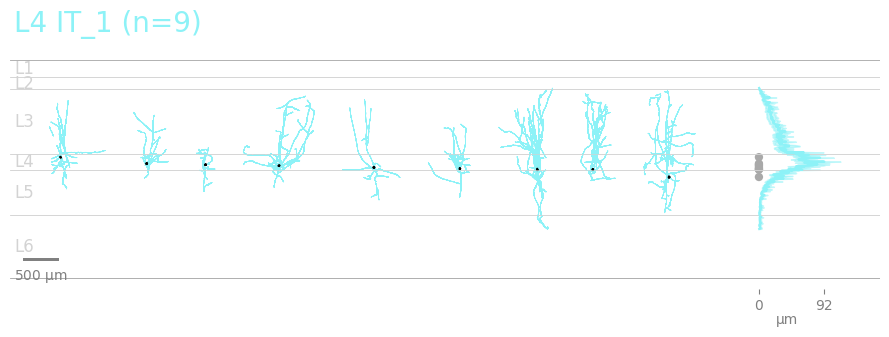

14 : L5 IT_6


<Figure size 640x480 with 0 Axes>

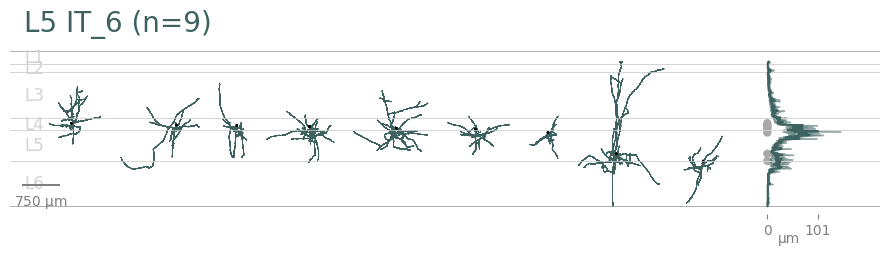

15 : L5 IT_5


<Figure size 640x480 with 0 Axes>

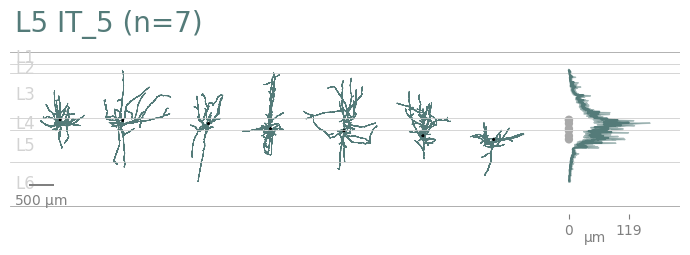

16 : L5 IT_2


<Figure size 640x480 with 0 Axes>

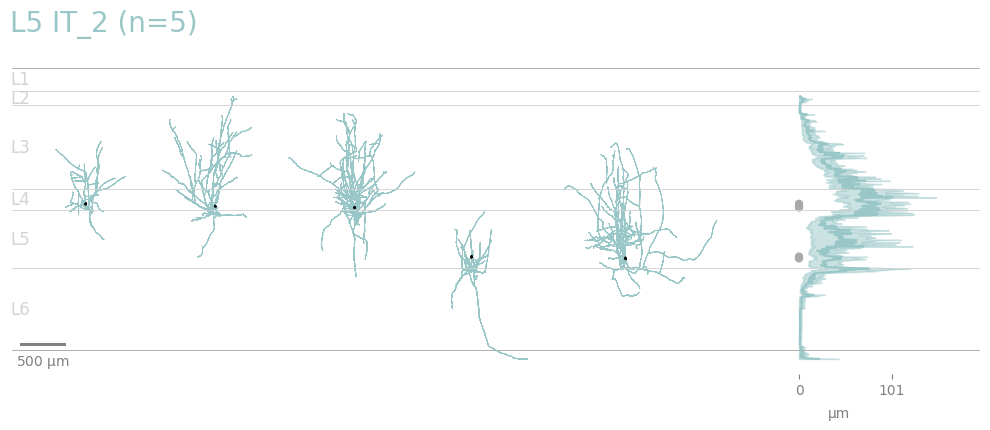

17 : L5 IT_1


<Figure size 640x480 with 0 Axes>

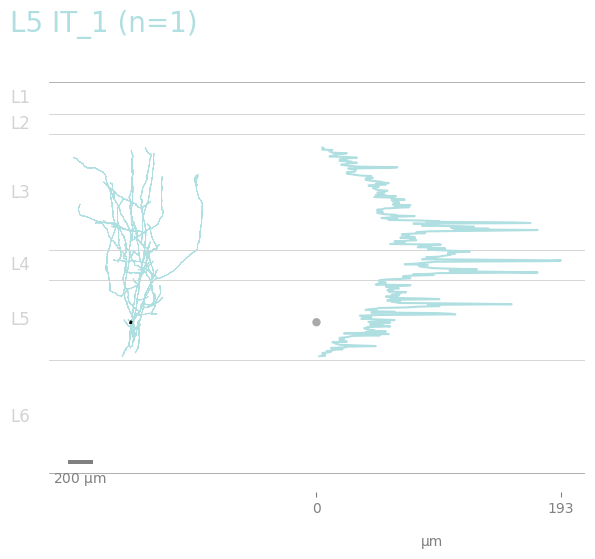

18 : L5 IT_7


<Figure size 640x480 with 0 Axes>

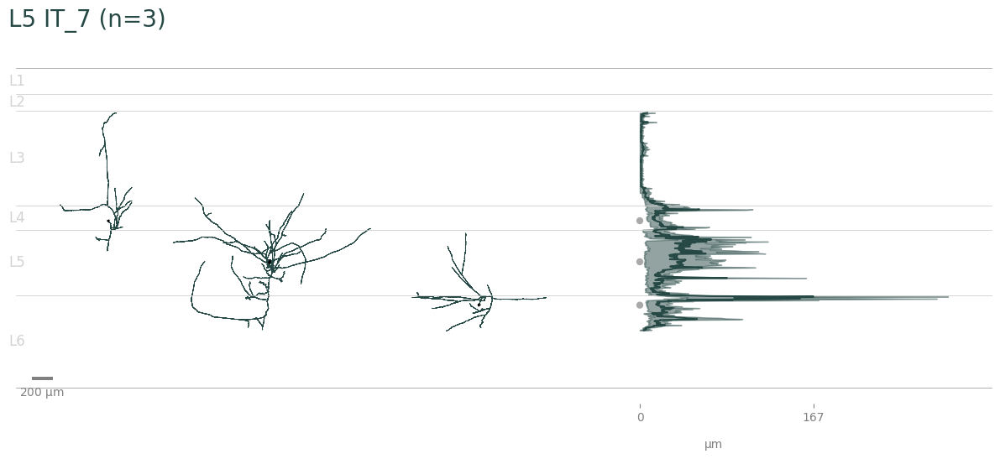

19 : L5 IT_3


<Figure size 640x480 with 0 Axes>

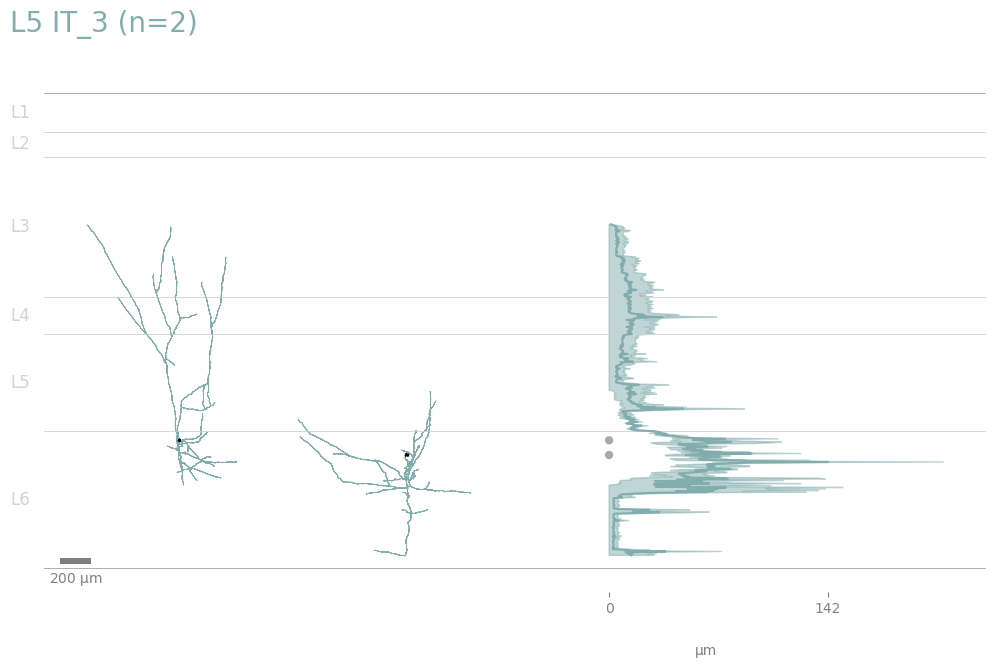

20 : L5/6 NP_2


<Figure size 640x480 with 0 Axes>

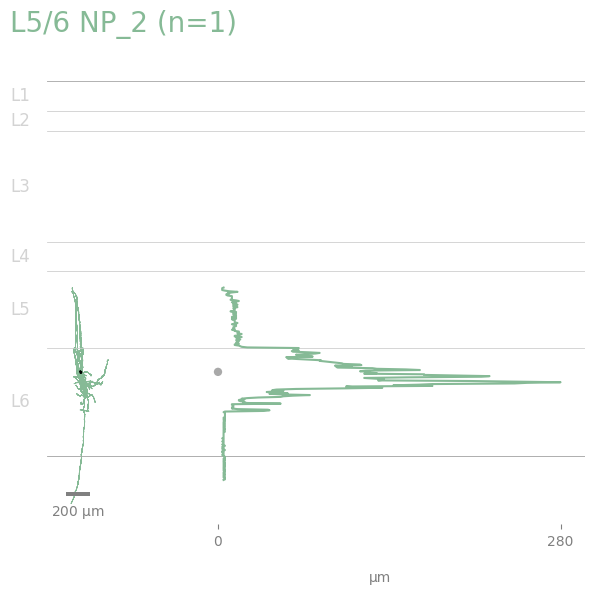

21 : L5/6 NP_6
22 : L5/6 NP_1


<Figure size 640x480 with 0 Axes>

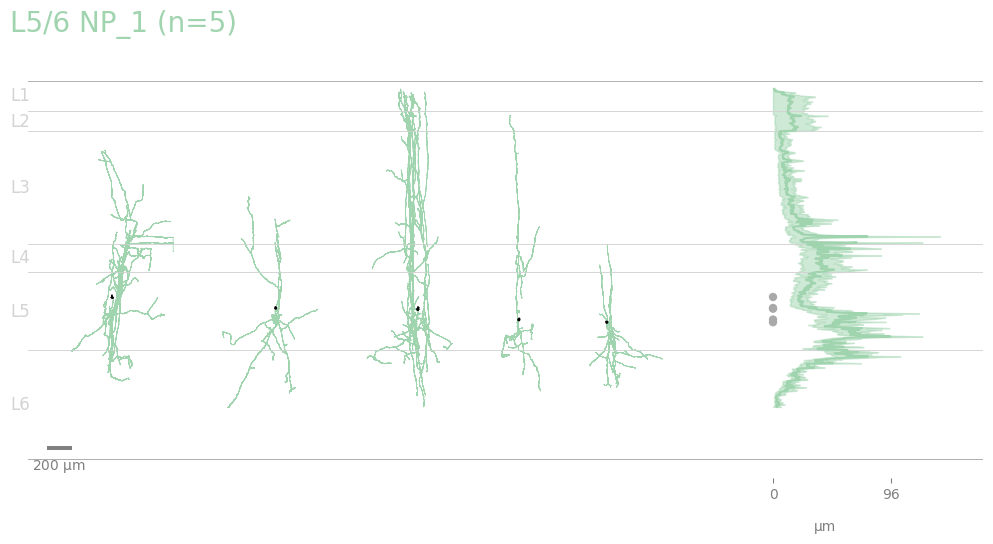

23 : L5/6 NP_3
24 : L5/6 NP_4


<Figure size 640x480 with 0 Axes>

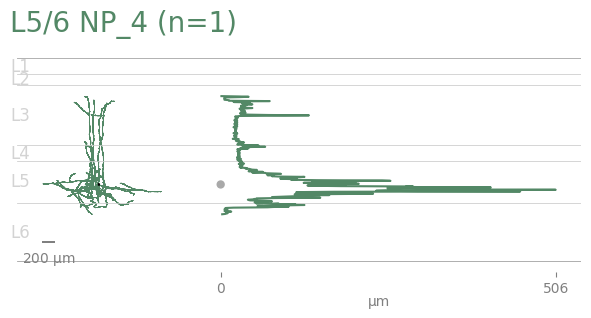

25 : L5 ET_1
26 : L5 ET_2


<Figure size 640x480 with 0 Axes>

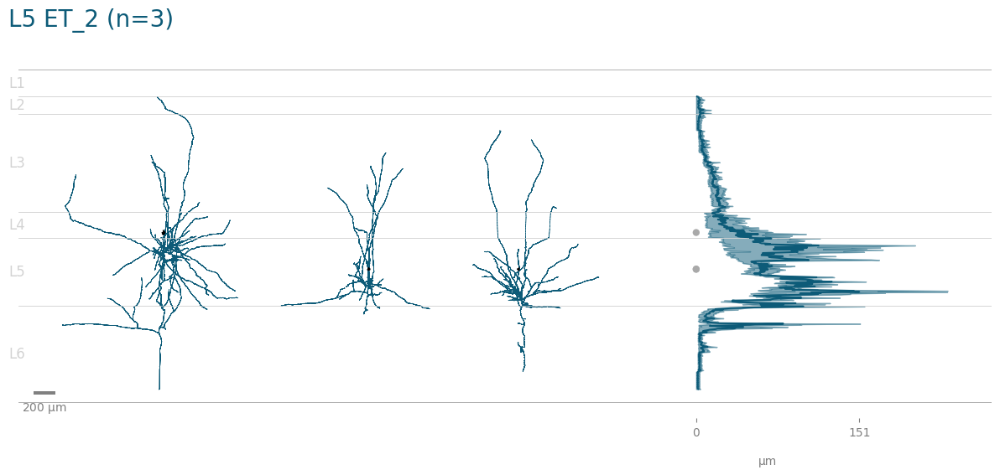

27 : L5 ET(ME)


<Figure size 640x480 with 0 Axes>

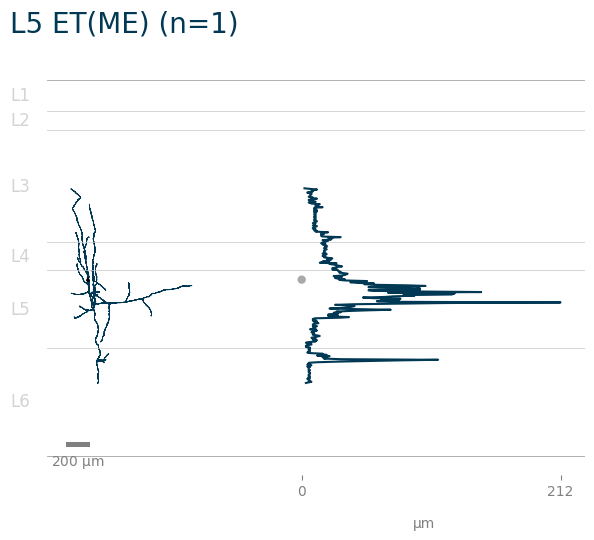

28 : L6 IT Car3_1


<Figure size 640x480 with 0 Axes>

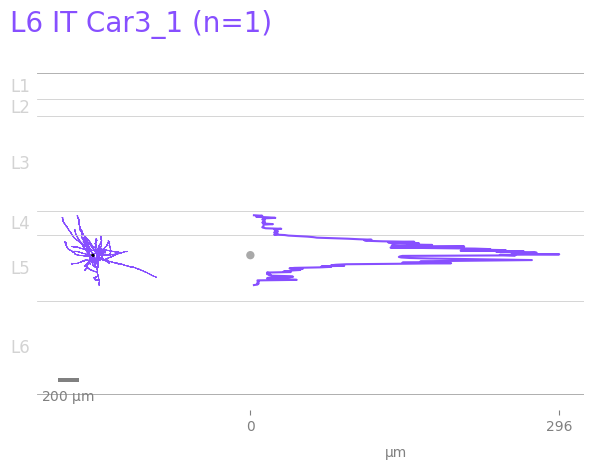

29 : L6 IT Car3_3


<Figure size 640x480 with 0 Axes>

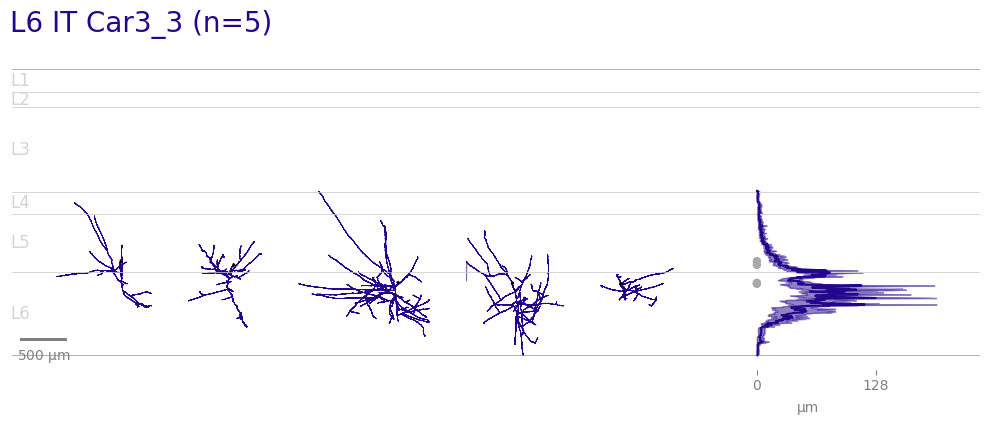

30 : L6 IT Car3_2
31 : L6 IT_2


<Figure size 640x480 with 0 Axes>

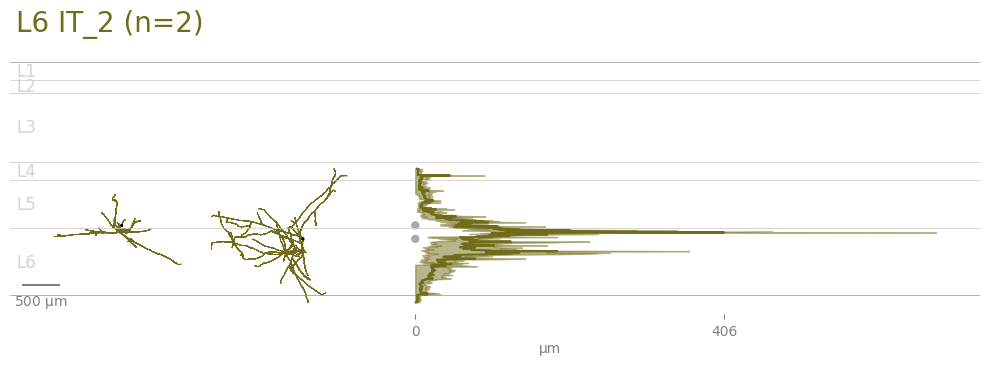

32 : L6 IT_1


<Figure size 640x480 with 0 Axes>

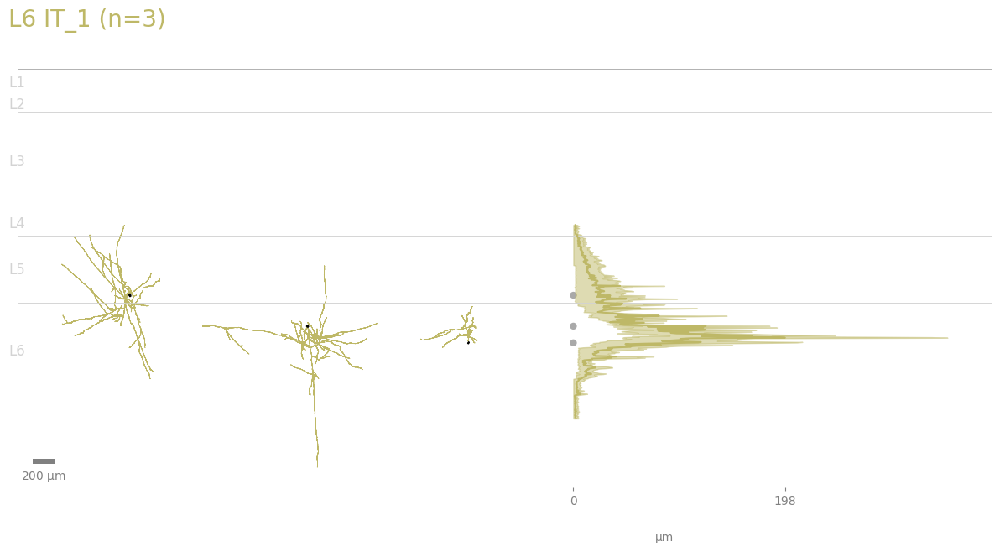

33 : L6 CT_3


<Figure size 640x480 with 0 Axes>

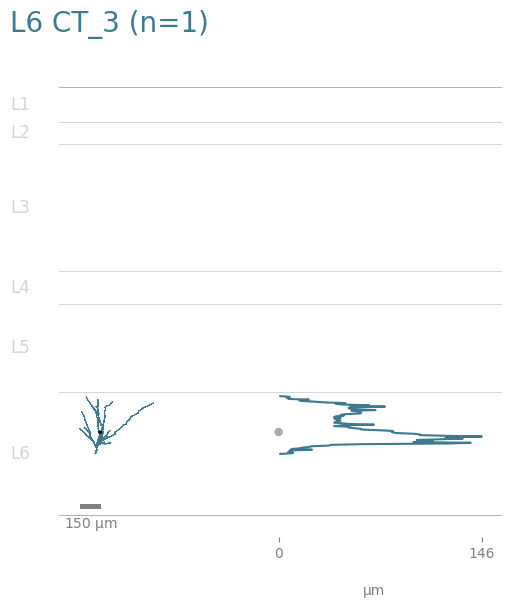

34 : L6 CT_2


<Figure size 640x480 with 0 Axes>

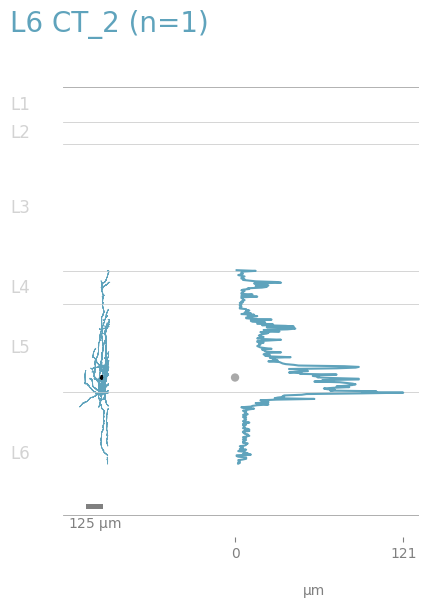

35 : L6 CT_4
36 : L6 CT_1


<Figure size 640x480 with 0 Axes>

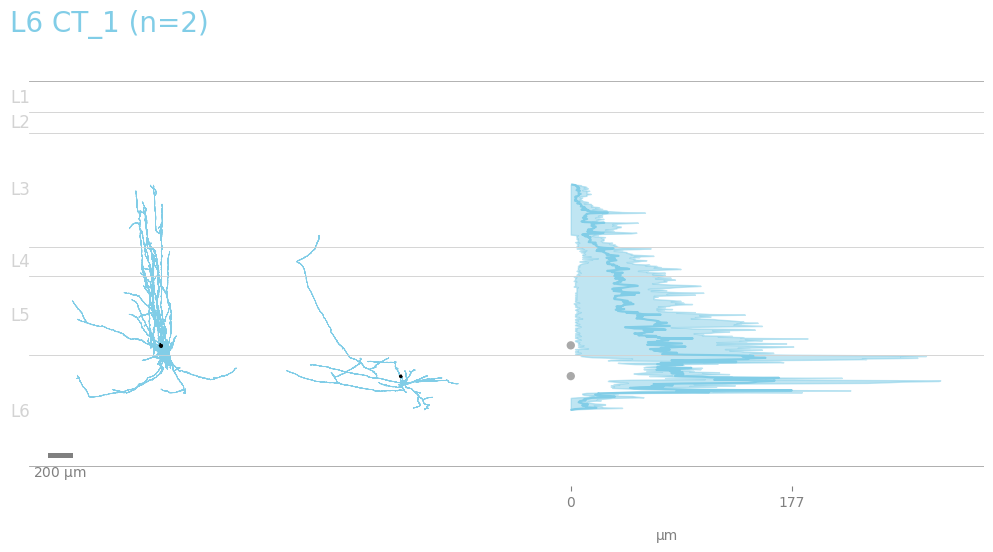

37 : L6b_6


<Figure size 640x480 with 0 Axes>

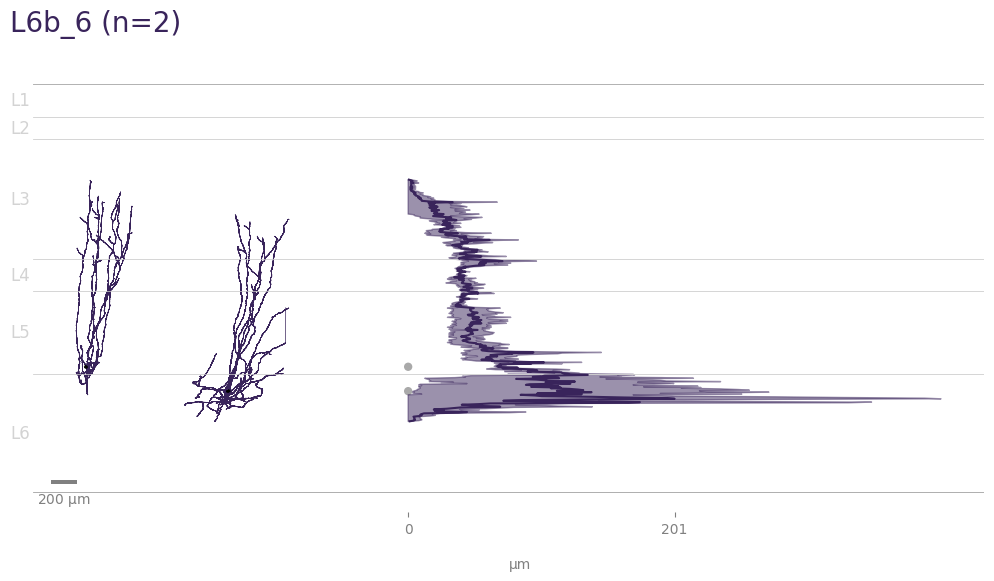

38 : L6b_3


<Figure size 640x480 with 0 Axes>

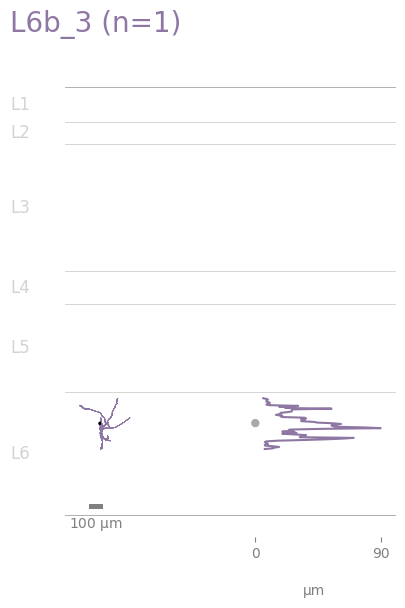

39 : L6b_5


<Figure size 640x480 with 0 Axes>

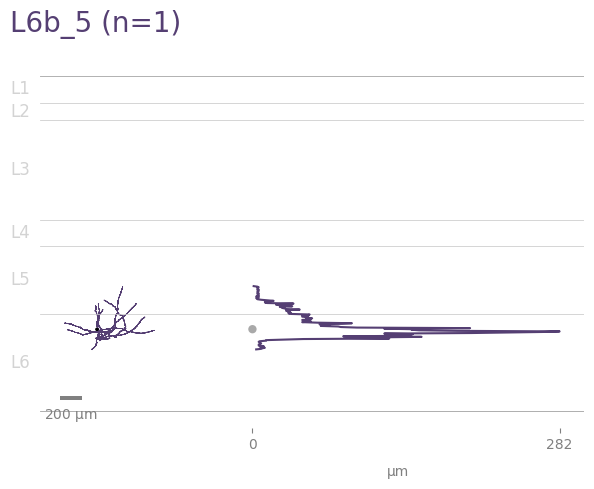

40 : L6b_1
41 : L6b_4
42 : L6b_2


<Figure size 640x480 with 0 Axes>

In [7]:
# plot a groups of cells w their depth histograms

intra_group_sort = ['soma_distance_from_pia']
fig_path = os.path.join(output_dir, 'human_excitatory_row_viewer_axon_byTtype_bySomaDepth_dendrite_histograms.pdf')
cell_title = False

##########################################

#get set of all groups (ttypes)
all_groups = group_order[group_var]

#which neuron compartments to plot 
compartment_list=[1,2] # node types to plot i.e. [soma, axon, basal, apical] 

#formatting text 
group_title_font_size = 20
group_title_start_height = 400 #starting height for group (e.g., region) title 
layer_label_font_size = 12
cell_title_start_height = 30 #starting height for cell title 
cell_title_y_buffer = 100

with PdfPages(fig_path) as pdf:
    with warnings.catch_warnings():
        warnings.simplefilter(action='ignore', category=FutureWarning)
        
        iz = 0
        for group in all_groups:
            print('{} : {}'.format(iz, group)); iz+=1
            #get group data 
            group_data = sorted_clean_data[sorted_clean_data.t_type == group]
            group_data = group_data.sort_values(by=intra_group_sort) #sort this group of data 

            cuttoff = 5
            if len(group_data) == 0: 
                continue
            elif len(group_data) > cuttoff:
                fig, axes = plt.subplots(nrows=1,ncols=1,sharey=True, figsize=(len(group_data),len(group_data))) 
            else:
                factor = (cuttoff+2)-len(group_data)
                scaled_size = factor * len(group_data)
                fig, axes = plt.subplots(nrows=1,ncols=1,sharey=True, figsize=(scaled_size,scaled_size)) 

            ax = axes

            ax.get_yaxis().set_visible(False)
            sns.despine(left=True, bottom=True)

            # ax.axis('off')
            xloc = 0
            xoffset = 0
            ax.set_anchor('W')
            ax.axhline(0, c="lightgrey",linewidth=0.50)
            buffer = 400

            for l in layer_info:
                ax.axhline(-layer_info[l], c=layer_colors[l],linewidth=0.50)
            for l in layer_labels:
                ax.text(-500,-layer_labels[l], "{}".format(l),verticalalignment='center', horizontalalignment='left',fontsize=layer_label_font_size, color='lightgrey') 
            
            #colors for ttype
            hex_color = color_dict[group][1:]
            contrast_level = 0.45
            lighter_color_rgb = tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))
            darker_color_rgb = tuple([int((contrast_level*x)) for x in lighter_color_rgb])
            grey_hex = '#8f8f8f'
            dark_hex = '#%02x%02x%02x' % darker_color_rgb
            hex_color = '#'+hex_color

            cell_type_colors_dict = {3: grey_hex, 4: grey_hex, 2: hex_color}
            # only show colors we specified in compartment_list
            morph_colors = {k:v for k,v in cell_type_colors_dict.items() if k in compartment_list}

            #title for group (i.e., ttype)
            ax.text(-500,group_title_start_height,
                "{} (n={}) ".format(group,len(group_data)),
                horizontalalignment='left',fontsize=group_title_font_size, color=hex_color) 

            #plot all the cells in this ttype 
            soma_depths_y = []
            i=-1
            for idx, row in group_data.iterrows():
                i+=1

                #get the cell 
                sp = sorted_clean_data.specimen_id[idx]
                swc_pth = sorted_clean_data.SWC_layer_aligned[sorted_clean_data.specimen_id == sp].iloc[0]
                nrn = morphology_from_swc(swc_pth)

                #save soma depth for plotting with histograms
                soma_depths_y.append(nrn.get_soma()['y'])

                #plot cell offset along the x axis from the previous cell 
                xoffset += leftextent(nrn,compartment_list)
                basic_morph_plot(nrn, ax=ax, xoffset=xoffset, morph_colors=morph_colors, scatter_roots = False, scatter_soma = False, plot_soma = True)

                # plot cell title
                if cell_title:
                    # text = sorted_clean_data.final_structure[sorted_clean_data.specimen_id == sp].iloc[0]
                    text2 = sorted_clean_data.specimen_id[sorted_clean_data.specimen_id == sp].iloc[0]
                    ax.text(xoffset, cell_title_start_height,text2,horizontalalignment='center',fontsize=4, color="dimgrey")
                    # ax.text(xoffset, cell_title_start_height+cell_title_y_buffer,text,horizontalalignment='center',fontsize=6, color="dimgrey")

                xoffset += rightextent(nrn,compartment_list)
                xoffset += buffer

                if i == 0:
                    #add a scale bar 
                    scalebar = ScaleBar(1, "um", location='lower left', frameon=False, length_fraction=0.05, color = 'grey')
                    ax.add_artist(scalebar)

                ax.set_aspect("equal") #so neurons don't look squised 

            # histos of axon, dendrite, and soma distributions 
            histo_compartments = [2] #[soma, axon, basal, apical] 

            bin_width = 5 #um
            depth_bins = [int(sub[2:])*bin_width*-1 for sub in aligned_histogram.filter(regex='2_').columns.tolist()] 

            histo_buffer = 500

            # ax_idx = 1
            histo_ticks = []
            histo_labels = []
            for compartment_num in histo_compartments:
                xoffset += histo_buffer 

                ax.get_yaxis().set_visible(False)
                sns.despine(left=True, bottom=True)
                # ax.xaxis.tick_top()
                xloc = 0
                ax.set_anchor('W')
                ax.axhline(0, c="lightgrey",linewidth=0.50)
                for l in layer_info:
                    ax.axhline(-layer_info[l], c=layer_colors[l],linewidth=0.50)

                #get data for plotting compartment histograms 
                axon_depth_avg = aligned_histogram.filter(regex=str(compartment_num)+'_')[aligned_histogram.specimen_id.isin(group_data.specimen_id)].mean(axis=0).transpose()
                axon_depth_sem = aligned_histogram.filter(regex=str(compartment_num)+'_')[aligned_histogram.specimen_id.isin(group_data.specimen_id)].sem(axis=0).transpose()
                
                #multiply by avg distance between nodes to get values in um 
                axon_depth_avg*=AVERAGE_DISTANCE_BETWEEN_NODES
                axon_depth_sem*=AVERAGE_DISTANCE_BETWEEN_NODES

                #scale 10x for viewing with cells
                histo_scale_val = 10
                axon_depth_avg*=histo_scale_val
                axon_depth_sem*=histo_scale_val

                #turn zeros to nans so they aren't plotted (this will cut out all zeros, even those in the middle, may want to change this to only naning the leading and trailing zeros)
                axon_depth_avg.replace(0, np.nan, inplace=True)
                axon_depth_sem.replace(0, np.nan, inplace=True)

                #add xoffset for plotting on same subplot as cells
                axon_depth_avg += xoffset 

                #plot
                if not np.isnan(axon_depth_avg).all():
                    #plot soma depth locations
                    soma_depths_x = np.zeros(len(soma_depths_y))
                    soma_depths_x+=xoffset
                    sns.scatterplot(x=soma_depths_x, y=soma_depths_y, ax=ax, color='darkgrey', edgecolor="none") #marker="$\circ$", 

                    #plot histos
                    ax.plot(axon_depth_avg, depth_bins, color = cell_type_colors_dict[compartment_num])
                    ax.fill_betweenx(depth_bins, axon_depth_avg-axon_depth_sem, axon_depth_avg+axon_depth_sem, alpha=0.5, edgecolor=cell_type_colors_dict[compartment_num], facecolor=cell_type_colors_dict[compartment_num])

                    histo_ticks.append(xoffset)
                    histo_labels.append('0')
                    histo_ticks.append(np.nanmax(axon_depth_avg))
                    histo_labels.append(str(round((np.nanmax(axon_depth_avg)-xoffset)/histo_scale_val)))

                    xoffset=np.nanmax(axon_depth_avg) + histo_buffer
                    if not np.isnan(axon_depth_sem).all(): xoffset += np.nanmax(axon_depth_sem)

                ax.set_xticks(histo_ticks)
                ax.set_xticklabels(histo_labels)
                ax.xaxis.label.set_color('grey')
                ax.tick_params(axis='x', colors='grey')
                ax.set_xlabel(u"\u03bcm")
                plt.tight_layout()
                _,xmax = ax.get_xlim()
                xlabel_yloc = ((histo_ticks[0]+histo_ticks[1])/2)/xmax
                ax.xaxis.set_label_coords(xlabel_yloc, -0.1)
            
            # save the current figure
            pdf.savefig(fig, bbox_inches='tight')
            plt.show() #show the fig
            plt.clf() #destoy current fig to save memory



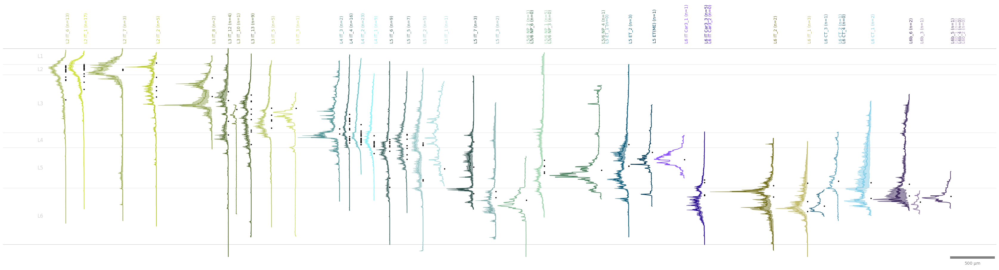

<Figure size 640x480 with 0 Axes>

In [8]:
# plot basal and apical dendrite histograms with soma depth loctions by ttype 

fig_path = os.path.join(output_dir, 'human_excitatory_histograms_axon_byTtype.pdf')
histo_compartments = [2] #[soma, axon, basal, apical]  # histos of axon, dendrite, and soma distributions 


#get set of all groups (ttypes)
all_groups = group_order[group_var]

#formatting text 
group_title_font_size = 10
group_title_start_height = 100 #starting height for group (e.g., region) title 
layer_label_font_size = 12
cell_title_start_height = 30 #starting height for cell title 

with PdfPages(fig_path) as pdf:
    with warnings.catch_warnings():
        warnings.simplefilter(action='ignore', category=FutureWarning)

        fig, ax = plt.subplots(nrows=1,ncols=1,sharey=True, figsize=(len(all_groups),10)) 

        ax.axis('off')
        xloc = 0
        xoffset = 0
        ax.set_anchor('W')
        ax.axhline(0, c="lightgrey",linewidth=0.50)
        buffer = 20

        for l in layer_info:
            ax.axhline(-layer_info[l], c=layer_colors[l],linewidth=0.50)
        for l in layer_labels:
            ax.text(-100,-layer_labels[l], "{}".format(l),verticalalignment='center', horizontalalignment='left',fontsize=layer_label_font_size, color='lightgrey') 
        
        i=-1
        for group in all_groups:
            i+=1
            #get group data 
            group_data = sorted_clean_data[sorted_clean_data.t_type == group]
            group_data = group_data.sort_values(by=intra_group_sort) #sort this group of data 

            #colors for ttype
            hex_color = color_dict[group][1:]
            contrast_level = 0.45
            lighter_color_rgb = tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))
            darker_color_rgb = tuple([int((contrast_level*x)) for x in lighter_color_rgb])
            grey_hex = '#8f8f8f'
            dark_hex = '#%02x%02x%02x' % darker_color_rgb
            hex_color = '#'+hex_color

            cell_type_colors_dict = {3: grey_hex, 4: grey_hex, 2: hex_color}
            # only show colors we specified in compartment_list
            morph_colors = {k:v for k,v in cell_type_colors_dict.items() if k in compartment_list}

            bin_width = 5 #um
            depth_bins = [int(sub[2:])*bin_width*-1 for sub in aligned_histogram.filter(regex='2_').columns.tolist()] 

            soma_depths_y = list(group_data.soma_distance_from_pia*-1)

            comp_idx = -1
            for compartment_num in histo_compartments:
                comp_idx+= 1

                #get data to plot compartment histograms 
                compartment_depth_avg = aligned_histogram.filter(regex=str(compartment_num)+'_')[aligned_histogram.specimen_id.isin(group_data.specimen_id)].mean(axis=0).transpose()
                compartment_depth_sem = aligned_histogram.filter(regex=str(compartment_num)+'_')[aligned_histogram.specimen_id.isin(group_data.specimen_id)].sem(axis=0).transpose()                
                #multiply by avg distance between nodes to get values in um 
                compartment_depth_avg*=AVERAGE_DISTANCE_BETWEEN_NODES
                compartment_depth_avg*=AVERAGE_DISTANCE_BETWEEN_NODES
                #turn zeros to nans so they aren't plotted (this will cut out all zeros, even those in the middle, may want to change this to only naning the leading and trailing zeros)
                compartment_depth_avg.replace(0, np.nan, inplace=True)
                compartment_depth_sem.replace(0, np.nan, inplace=True)

                #save compartment max for updating xoffset
                temp = compartment_depth_avg+compartment_depth_sem
                if not np.isnan(temp).all(): dynamic_buffer = np.nanmax(temp)
                elif np.isnan(compartment_depth_avg).all(): dynamic_buffer = buffer
                else: dynamic_buffer = np.nanmax(compartment_depth_avg)

                if comp_idx == 0:
                    #its the first compartment, so plot soma depths first 
                    xoffset += buffer + dynamic_buffer
                    soma_depths_x = np.ones(len(soma_depths_y))*xoffset
                    #plot soma depth locations
                    sns.scatterplot(x=soma_depths_x, y=soma_depths_y, ax=ax, color='black', edgecolor="none", s=10) #marker="$\circ$", 

                    #first compartment should be inverted along x axis
                    compartment_depth_avg *= -1
                    compartment_depth_sem *= -1

                #add xoffset so data is plot at correct position 
                compartment_depth_avg += xoffset

                #plot
                ax.plot(compartment_depth_avg, depth_bins, color = cell_type_colors_dict[compartment_num])
                ax.fill_betweenx(depth_bins, compartment_depth_avg-compartment_depth_sem, compartment_depth_avg+compartment_depth_sem, alpha=0.5, edgecolor=cell_type_colors_dict[compartment_num], facecolor=cell_type_colors_dict[compartment_num])

                #save label 
                ax.text(xoffset,group_title_start_height,
                "{} (n={}) ".format(group,len(group_data)),
                horizontalalignment='left',fontsize=group_title_font_size, color=hex_color, rotation=90)

                if comp_idx == 1:
                    #it's the last compartment, so add the second compartment histo width to xoffset
                    xoffset += dynamic_buffer

                if i == 0 and comp_idx==0:
                    #add a scale bar 
                    scalebar = ScaleBar(1, "um", location='lower right', frameon=False, length_fraction=0.05, color = 'grey')
                    ax.add_artist(scalebar)


    #save fig
    pdf.savefig(fig, bbox_inches='tight')
    plt.show() #show the fig
    plt.clf() #destoy current fig to save memory



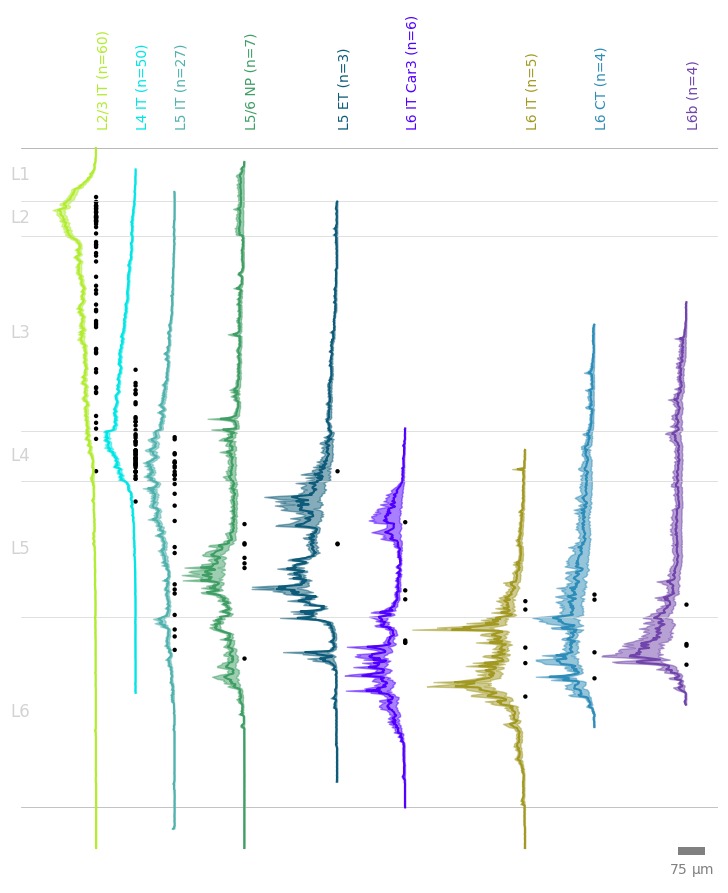

<Figure size 640x480 with 0 Axes>

In [9]:
# plot basal and apical dendrite histograms with soma depth loctions by subclass

#within a group, what to sort by
fig_path = os.path.join(output_dir, 'human_excitatory_histograms_axon_bySubclass.pdf')

#get set of all groups (ttypes)
all_groups = group_order['subclass_label']

group_color_dict = color_dict
group_var_name = 'subclass_label'

#formatting text 
group_title_font_size = 10
group_title_start_height = 100 #starting height for group (e.g., region) title 
layer_label_font_size = 12
cell_title_start_height = 30 #starting height for cell title 

with PdfPages(fig_path) as pdf:
    with warnings.catch_warnings():
        warnings.simplefilter(action='ignore', category=FutureWarning)

        fig, ax = plt.subplots(nrows=1,ncols=1,sharey=True, figsize=(len(all_groups),10)) 

        ax.axis('off')
        xloc = 0
        xoffset = 0
        ax.set_anchor('W')
        ax.axhline(0, c="lightgrey",linewidth=0.50)
        buffer = 20

        for l in layer_info:
            ax.axhline(-layer_info[l], c=layer_colors[l],linewidth=0.50)
        for l in layer_labels:
            ax.text(-100,-layer_labels[l], "{}".format(l),verticalalignment='center', horizontalalignment='left',fontsize=layer_label_font_size, color='lightgrey') 
        
        i=-1
        for group in all_groups:
            i+=1
            #get group data 
            group_data = sorted_clean_data[sorted_clean_data[group_var_name] == group]
            group_data = group_data.sort_values(by=intra_group_sort) #sort this group of data 

            #colors for ttype
            hex_color = group_color_dict[group][1:]
            contrast_level = 0.45
            lighter_color_rgb = tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))
            darker_color_rgb = tuple([int((contrast_level*x)) for x in lighter_color_rgb])
            grey_hex = '#8f8f8f'
            dark_hex = '#%02x%02x%02x' % darker_color_rgb
            hex_color = '#'+hex_color

            cell_type_colors_dict = {3: grey_hex, 4: grey_hex, 2: hex_color}
            # only show colors we specified in compartment_list
            morph_colors = {k:v for k,v in cell_type_colors_dict.items() if k in compartment_list}

            # histos of axon, dendrite, and soma distributions 
            histo_compartments = [2] #[soma, axon, basal, apical] 

            bin_width = 5 #um
            depth_bins = [int(sub[2:])*bin_width*-1 for sub in aligned_histogram.filter(regex='2_').columns.tolist()] 

            soma_depths_y = list(group_data.soma_distance_from_pia*-1)

            comp_idx = -1
            for compartment_num in histo_compartments:
                comp_idx+= 1

                #get data to plot compartment histograms 
                compartment_depth_avg = aligned_histogram.filter(regex=str(compartment_num)+'_')[aligned_histogram.specimen_id.isin(group_data.specimen_id)].mean(axis=0).transpose()
                compartment_depth_sem = aligned_histogram.filter(regex=str(compartment_num)+'_')[aligned_histogram.specimen_id.isin(group_data.specimen_id)].sem(axis=0).transpose()                
                #multiply by avg distance between nodes to get values in um 
                compartment_depth_avg*=AVERAGE_DISTANCE_BETWEEN_NODES
                compartment_depth_avg*=AVERAGE_DISTANCE_BETWEEN_NODES
                #turn zeros to nans so they aren't plotted (this will cut out all zeros, even those in the middle, may want to change this to only naning the leading and trailing zeros)
                compartment_depth_avg.replace(0, np.nan, inplace=True)
                compartment_depth_sem.replace(0, np.nan, inplace=True)

                #save compartment max for updating xoffset
                temp = compartment_depth_avg+compartment_depth_sem
                if not np.isnan(temp).all(): dynamic_buffer = np.nanmax(temp)
                elif np.isnan(compartment_depth_avg).all(): dynamic_buffer = buffer
                else: dynamic_buffer = np.nanmax(compartment_depth_avg)

                if comp_idx == 0:
                    #its the first compartment, so plot soma depths first 
                    xoffset += buffer + dynamic_buffer
                    soma_depths_x = np.ones(len(soma_depths_y))*xoffset
                    #plot soma depth locations
                    sns.scatterplot(x=soma_depths_x, y=soma_depths_y, ax=ax, color='k', edgecolor="none", s=10) #marker="$\circ$", 

                    #first compartment should be inverted along x axis
                    compartment_depth_avg *= -1
                    compartment_depth_sem *= -1

                #add xoffset so data is plot at correct position 
                compartment_depth_avg += xoffset

                #plot
                ax.plot(compartment_depth_avg, depth_bins, color = cell_type_colors_dict[compartment_num])
                ax.fill_betweenx(depth_bins, compartment_depth_avg-compartment_depth_sem, compartment_depth_avg+compartment_depth_sem, alpha=0.5, edgecolor=cell_type_colors_dict[compartment_num], facecolor=cell_type_colors_dict[compartment_num])

                #save label 
                ax.text(xoffset,group_title_start_height,
                "{} (n={}) ".format(group,len(group_data)),
                horizontalalignment='left',fontsize=group_title_font_size, color=hex_color, rotation=90)

                if comp_idx == 1:
                    #it's the last compartment, so add the second compartment histo width to xoffset
                    xoffset += dynamic_buffer

                if i == 0 and comp_idx==0:
                    #add a scale bar 
                    scalebar = ScaleBar(1, "um", location='lower right', frameon=False, length_fraction=0.05, color = 'grey')
                    ax.add_artist(scalebar)

    # #save fig
    pdf.savefig(fig, bbox_inches='tight')
    plt.show() #show the fig
    plt.clf() #destoy current fig to save memory



Subclass x feature box plots with stats

In [10]:
# subclass x feature stats
x_var = 'subclass_label' #what to do box plots on 
features = raw_feature_wide.columns.tolist()[1:]

x_var_order = group_order[x_var]


# Kruscal-Wallis H test on all features
kw_pvals = dict()
kw_hvals = dict()
for f in features:

    # Create a list of groups dynamically
    groups = [sorted_clean_data.loc[sorted_clean_data[x_var] == x][f].dropna() for x in x_var_order]
    
    # Only include groups that have data
    groups = [group for group in groups if not group.empty]

    if len(groups) < 2:
        print(f"Not enough groups with data for feature {f}")
        continue
    try:
        hvalue, pvalue = kruskal(*groups, nan_policy='omit')
        kw_hvals[f] = hvalue
        kw_pvals[f] = pvalue
    except ValueError as e:
        print(f'Kruskal-Wallis not calculated for {f} because of an error: {e}')

#FDR correction 
kw_pvals_list = list(kw_pvals.values())
kw_rejected_list, kw_pvals_fdr_list = fdrcorrection(kw_pvals_list, alpha=0.05, method='indep', is_sorted=False) 

kw_pvals_fdr = dict(zip(list(kw_pvals.keys()), list(kw_pvals_fdr_list)))
kw_rejected = dict(zip(list(kw_pvals.keys()), list(kw_rejected_list)))

#Post Hoc Dunn test for significant KW features, with FDR correction 
dunn_pvals_fdr = dict()
for k, v in kw_rejected.items():
    if v: #if null hypothesis was rejected, calculate dunn post hoc
        dunn_pvals_fdr[k] = posthoc_dunn(sorted_clean_data, val_col=k, group_col=x_var, p_adjust='fdr_bh', sort=True)


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L2/3 IT vs. L4 IT: Custom statistical test, P_val:6.446e-08
L4 IT vs. L5 IT: Custom statistical test, P_val:1.410e-02
L2/3 IT vs. L5 IT: Custom statistical test, P_val:8.254e-14
L4 IT vs. L5/6 NP: Custom statistical test, P_val:2.170e-02
L2/3 IT vs. L5/6 NP: Custom statistical test, P_val:2.078e-07
L2/3 IT vs. L5 ET: Custom statistical test, P_val:5.338e-03
L4 IT vs. L6 IT Car3: Custom statistical test, P_val:1.456e-02
L4 IT vs. L6 IT: Custom statistical test, P_val:9.043e-03
L2/3 IT vs. L6 IT Car3: Custom statistical test, P_val:2.078e-07
L4 IT vs. L6 CT: Custom statistical test, P_val:2.170e-02
L2/3 IT vs. L6 IT: Custom statistical test, P_val:2.078e-07
L2/3 IT vs. L6 CT: Custom statistical test, P_val:5.339e-06
L4 IT vs. L6b: Custom statistical test, P_val:1.867e-02
L2/3 IT vs. L6b: Custom stat

c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(
c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(
c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L2/3 IT vs. L4 IT: Custom statistical test, P_val:2.548e-13
L4 IT vs. L5 IT: Custom statistical test, P_val:1.906e-02
L2/3 IT vs. L5 IT: Custom statistical test, P_val:1.906e-02
L4 IT vs. L6 IT Car3: Custom statistical test, P_val:4.841e-03
L4 IT vs. L6 IT: Custom statistical test, P_val:3.772e-02


c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L5 ET vs. L6b: Custom statistical test, P_val:3.272e-02
L5 IT vs. L6b: Custom statistical test, P_val:1.138e-02
L4 IT vs. L6b: Custom statistical test, P_val:4.669e-02
L2/3 IT vs. L6b: Custom statistical test, P_val:1.138e-02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L2/3 IT vs. L5 IT: Custom statistical test, P_val:4.296e-02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L4 IT vs. L5/6 NP: Custom statistical test, P_val:3.764e-02
L5/6 NP vs. L6 IT Car3: Custom statistical test, P_val:3.764e-02
p-value annot

c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(
c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L5 ET vs. L6 IT: Custom statistical test, P_val:4.964e-02
L5 IT vs. L6 IT: Custom statistical test, P_val:4.964e-02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L4 IT vs. L5 IT: Custom statistical test, P_val:2.163e-02
L5 ET vs. L6 IT Car3: Custom statistical test, P_val:3.741e-02
L2/3 IT vs. L5 IT: Custom statistical test, P_val:1.912e-02
L5 ET vs. L6 IT: Custom statistical test, P_val:2.163e-02
L5 IT vs. L6 IT Car3: Custom statistical test, P_val:2.607e-02
L5 IT vs. L6 IT: Custom statistical test, P_val:1.912e-02


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\2409087955.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(7,6),sharex=True, gridspec_kw = {'wspace':0, 'hspace':0.1}) #gridspec_kw = {'wspace':0, 'hspace':0},


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L2/3 IT vs. L4 IT: Custom statistical test, P_val:2.452e-02
L4 IT vs. L5 IT: Custom statistical test, P_val:1.016e-03
L4 IT vs. L5/6 NP: Custom statistical test, P_val:3.233e-04
L4 IT vs. L5 ET: Custom statistical test, P_val:8.517e-03
L2/3 IT vs. L5/6 NP: Custom statistical test, P_val:1.141e-02
L5 IT vs. L6 IT Car3: Custom statistical test, P_val:3.489e-02
L5 IT vs. L6 IT: Custom statistical test, P_val:2.452e-02
L4 IT vs. L6 IT Car3: Custom statistical test, P_val:4.332e-05
L4 IT vs. L6 IT: Custom statistical test, P_val:4.332e-05
L2/3 IT vs. L6 IT Car3: Custom statistical test, P_val:1.863e-03
L4 IT vs. L6 CT: Custom statistical test, P_val:5.594e-04
L2/3 IT vs. L6 IT: Custom statistical test, P_val:1.747e-03
L2/3 IT vs. L6 CT: Custom statistical test, P_val:9.469e-03
L4 IT vs. L6b: Custom sta

c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L2/3 IT vs. L4 IT: Custom statistical test, P_val:9.530e-08
L2/3 IT vs. L5 IT: Custom statistical test, P_val:2.665e-11
L2/3 IT vs. L5/6 NP: Custom statistical test, P_val:1.638e-02
L2/3 IT vs. L5 ET: Custom statistical test, P_val:1.462e-02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L2/3 IT vs. L4 IT: Custom statistical test, P_val:1.982e-12
L2/3 IT vs. L5 IT: Custom statistical test, P_val:1.008e-03
L2/3 IT vs. L5/6 NP: Custom statistical test, P_val:1.151e-02
L2/3 IT vs. L6 CT: Custom statistical test, P_val:3.114e-02
L2/3 IT vs. L6b: Custom statistical test, P_val:1.151e-02


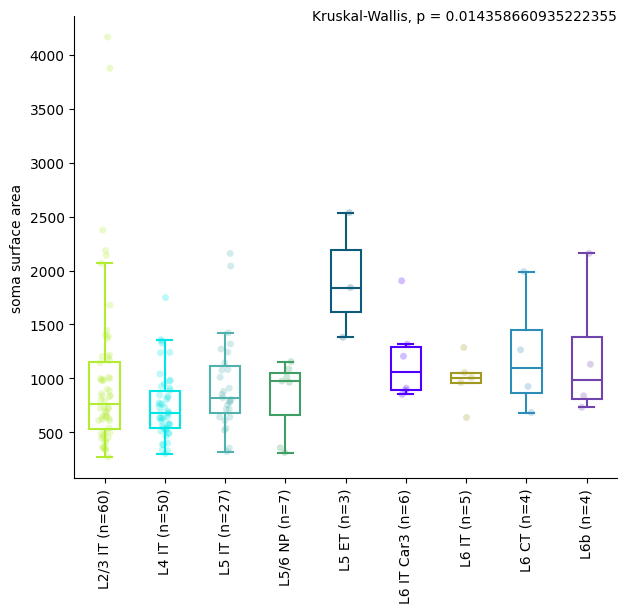

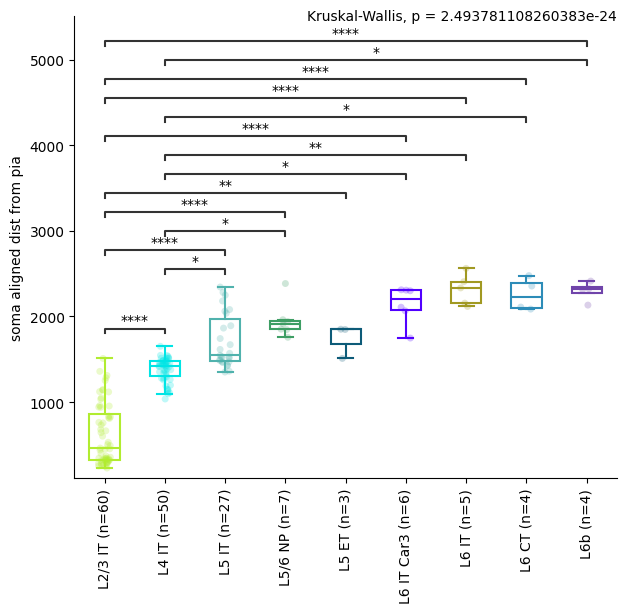

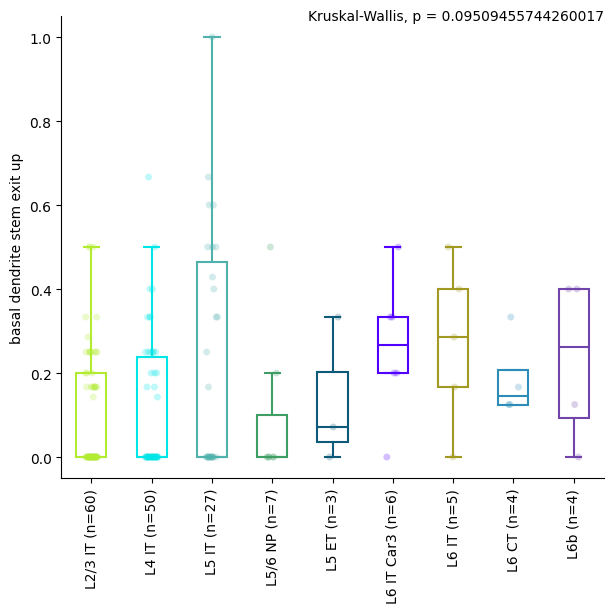

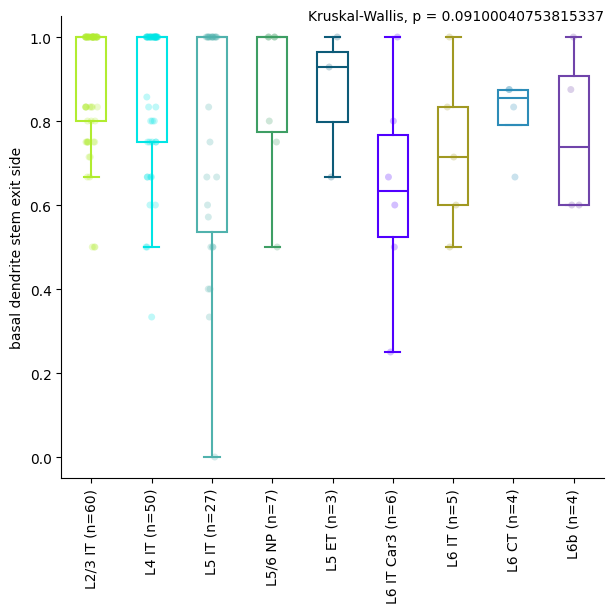

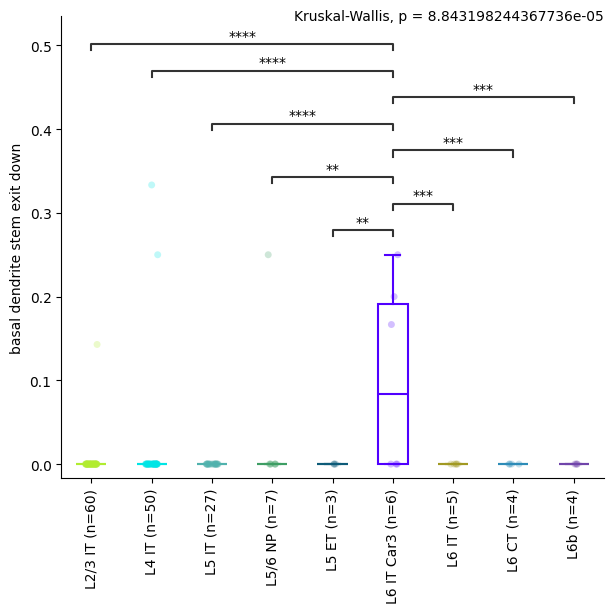

...

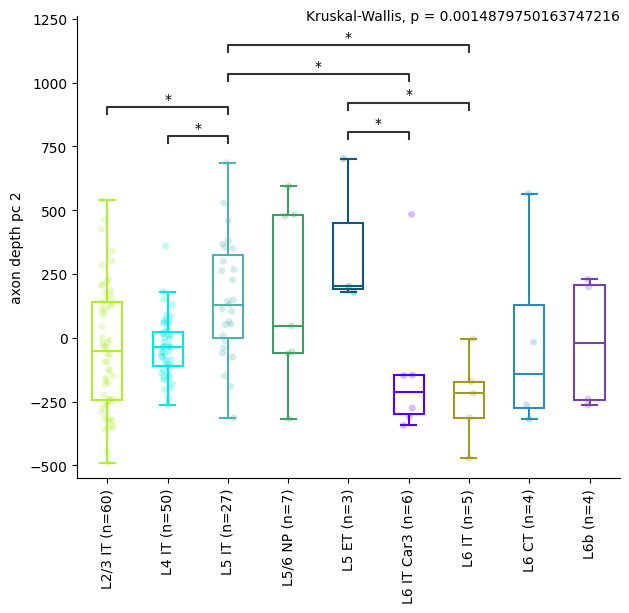

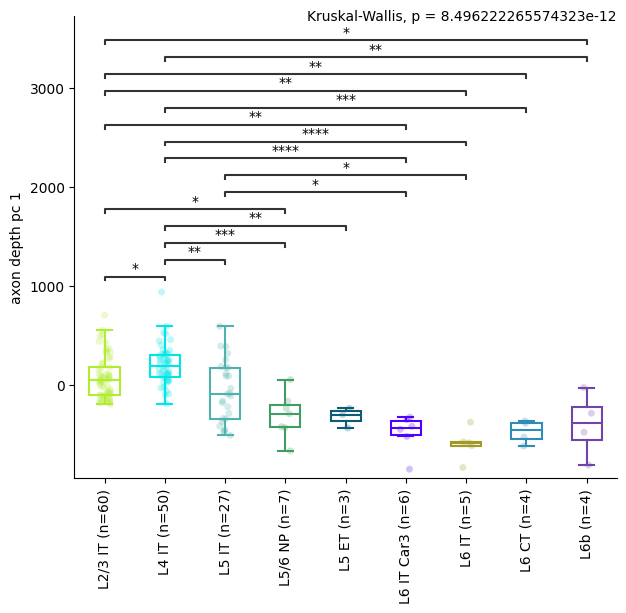

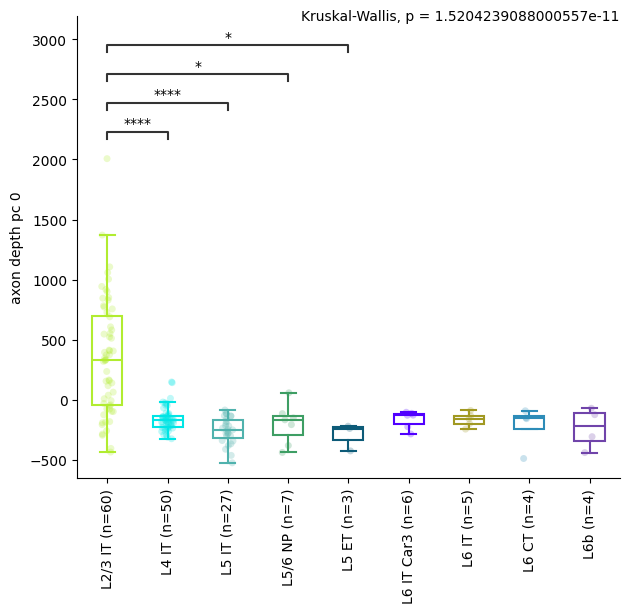

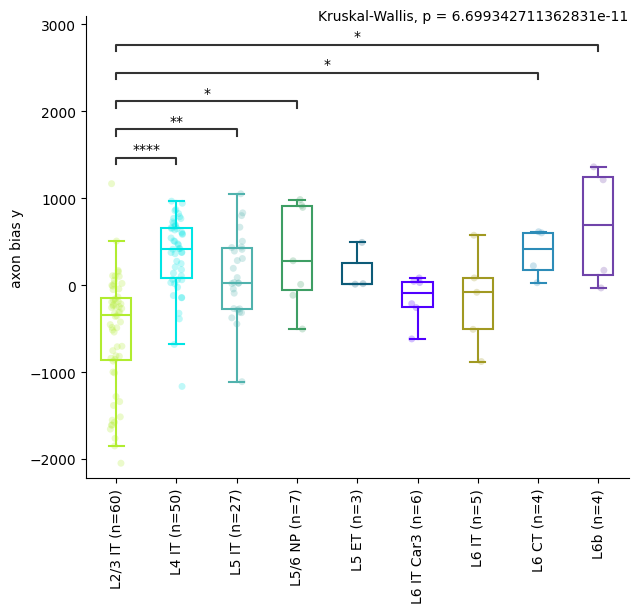

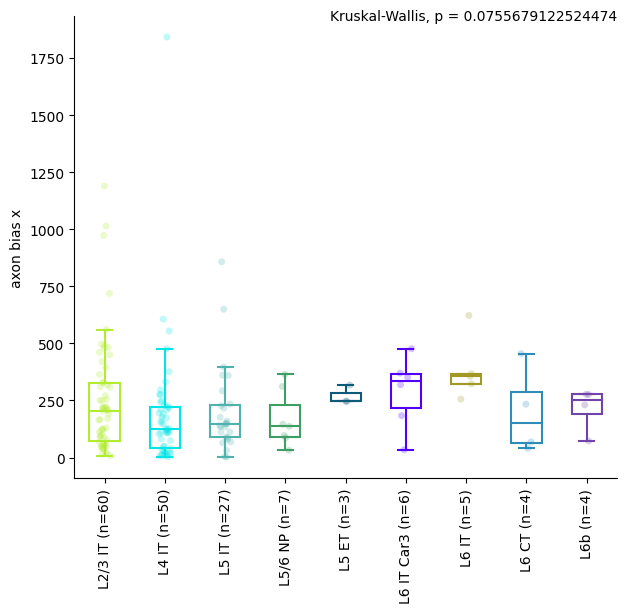

<Figure size 640x480 with 0 Axes>

In [11]:
# subclass x feature box plots

#ADJUST VARS
fig_name = 'human_excitatory_boxplots_axon_features_KW_Dunn_FDR_bySubclass.pdf'

color_palette = color_dict #colors for x_var
hue_var = 't_type' #seperate strip plots into these categories 
hue_color_palette = color_dict #color palette for hue_var
##### MAKE SURE TO UPDATE KRUSKAL CALL IN CODE BELOW TO CONTAIN ALL THE X_VAR GROUPS #####

#######################

fig_path = os.path.join(output_dir, fig_name)
features = raw_feature_wide.columns.tolist()[1:] 

with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)

    with PdfPages(fig_path) as pdf:
        while features != []:
            
            #one fig per page, each has page (fig) has 4 rows. 
            fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(7,6),sharex=True, gridspec_kw = {'wspace':0, 'hspace':0.1}) #gridspec_kw = {'wspace':0, 'hspace':0},
            # for ax in axes: #plot as many neurons as fit on this page (num_rows rows of plotting)
            
            y_var = features.pop()
            
            sns.stripplot(data=sorted_clean_data, x=x_var, y=y_var, ax=ax, order=x_var_order, palette=color_palette, alpha=0.25)
            # sns.stripplot(data=sorted_clean_data, x=x_var, y=y_var, ax=ax, order=x_var_order, palette=hue_color_palette, alpha=0.25, 
            #                   hue=hue_var, dodge=True, jitter=False) #TODO figure out how to do this with no legend
            # ax.legend_.remove()
            sns.boxplot(data=sorted_clean_data, x=x_var, y=y_var, ax=ax, order=x_var_order, palette=color_palette, saturation=1, showfliers = False, width=0.5)
            format_box_plot(ax) #color line not fill of boxplot


            #add num observations per x_var
            nobs = []
            for t in x_var_order:
                n = len(sorted_clean_data[sorted_clean_data[x_var] == t])
                nobs.append(" (n=%s)" % str(n))
            new_x_tick_labels = [x_var_order[i] + nobs[i] for i in range(len(x_var_order))]  
            ax.set_xticklabels(new_x_tick_labels)

            # add stats (KW w/ Dunn post hoc FDR corrected)

            #plot signif dunn fdr p-vals 
            if y_var in dunn_pvals_fdr.keys(): 
                #kw fdr val was signif so there are dunn fdr vals to plot
                
                this_dunn_pvals_fdr = dunn_pvals_fdr[y_var]
                remove = np.tril(np.ones(this_dunn_pvals_fdr.shape), k=0).astype("bool")
                this_dunn_pvals_fdr[remove] = np.nan
                dunn_pvals_fdr_melt = this_dunn_pvals_fdr.melt(ignore_index=False).reset_index().dropna()

                #set insignificant pvals to nan 
                p_thresh = 0.05 #threshold for plotting p vals 
                dunn_pvals_fdr_melt.drop(dunn_pvals_fdr_melt[dunn_pvals_fdr_melt['value'] > p_thresh].index, inplace = True)

                #plot bar for all signif fdr corrected dunn p vals 
                pairs = [(i[1]["index"], i[1]["variable"]) for i in dunn_pvals_fdr_melt.iterrows()]
                if len(pairs): 
                    #there's at least one pair of x_vals for which fdr corrected dunn test is signif
                    p_values = [i[1]["value"] for i in dunn_pvals_fdr_melt.iterrows()]                    
                    annotator = Annotator(ax, pairs, data=sorted_clean_data, x=x_var, y=y_var, order=x_var_order)
                    annotator.configure(text_format="star", loc="inside") #text_format="simple"
                    annotator.set_pvalues_and_annotate(p_values)
                    
            #plot Kruskal-Wallis fdr p-vals
            if y_var in kw_pvals_fdr.keys():
                xlimit = ax.get_xlim()
                ylimit = ax.get_ylim()
                p_txt = 'Kruskal-Wallis, p = ' + str(kw_pvals_fdr[y_var])
                ax.text(xlimit[1], ylimit[1], p_txt, verticalalignment='center', horizontalalignment='right')

            #rotate and format x_var labels 
            ax.set(xlabel=None)
            ax.tick_params(axis='x', rotation=90)
            ax.set_ylabel(y_var.replace("_", " "), rotation=90)
            ax.spines[['right', 'top']].set_visible(False)

            fig.subplots_adjust(wspace=0, hspace=0.0)
            pdf.savefig(dpi=600, bbox_inches='tight')
        plt.show()
        plt.clf()
        print()



T-type x feature box plots with stats

In [12]:
# subclass x feature stats
x_var = 't_type' #what to do box plots on 
features = raw_feature_wide.columns.tolist()[1:]

x_var_order = [x for x in group_order[x_var] if x in sorted_clean_data[x_var].tolist()]


# Kruscal-Wallis H test on all features
kw_pvals = dict()
kw_hvals = dict()
for f in features:
    # Create a list of groups dynamically
    groups = [sorted_clean_data.loc[sorted_clean_data[x_var] == x][f].dropna() for x in x_var_order]
    
    # Only include groups that have data
    groups = [group for group in groups if not group.empty]

    if len(groups) < 2:
        print(f"Not enough groups with data for feature {f}")
        continue
    try:
        hvalue, pvalue = kruskal(*groups, nan_policy='omit')
        kw_hvals[f] = hvalue
        kw_pvals[f] = pvalue
    except ValueError as e:
        print(f'Kruskal-Wallis not calculated for {f} because of an error: {e}')

#FDR correction 
kw_pvals_list = list(kw_pvals.values())
kw_rejected_list, kw_pvals_fdr_list = fdrcorrection(kw_pvals_list, alpha=0.05, method='indep', is_sorted=False) 

kw_pvals_fdr = dict(zip(list(kw_pvals.keys()), list(kw_pvals_fdr_list)))
kw_rejected = dict(zip(list(kw_pvals.keys()), list(kw_rejected_list)))

#Post Hoc Dunn test for significant KW features, with FDR correction 
dunn_pvals_fdr = dict()
for k, v in kw_rejected.items():
    if v: #if null hypothesis was rejected, calculate dunn post hoc
        dunn_pvals_fdr[k] = posthoc_dunn(sorted_clean_data, val_col=k, group_col=x_var, p_adjust='fdr_bh', sort=True)


c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(
c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L2 IT_2 vs. L4 IT_1: Custom statistical test, P_val:2.793e-02
L2 IT_1 vs. L4 IT_4: Custom statistical test, P_val:1.566e-02
L2 IT_7 vs. L4 IT_1: Custom statistical test, P_val:4.299e-02
L2 IT_1 vs. L4 IT_2: Custom statistical test, P_val:1.485e-04
L2 IT_6 vs. L4 IT_4: Custom statistical test, P_val:4.851e-02
L2 IT_2 vs. L5 IT_6: Custom statistical test, P_val:1.532e-02
L2 IT_1 vs. L4 IT_1: Custom statistical test, P_val:1.616e-04
L2 IT_6 vs. L4 IT_2: Custom statistical test, P_val:1.611e-03
L2 IT_7 vs. L5 IT_6: Custom statistical test, P_val:2.897e-02
L2 IT_6 vs. L4 IT_1: Custom statistical test, P_val:9.310e-04
L2 IT_2 vs. L5 IT_2: Custom statistical test, P_val:2.276e-02
L2 IT_1 vs. L5 IT_6: Custom statistical test, P_val:6.179e-05
L2 IT_7 vs. L5 IT_2: Custom statistical test, P_val:3.146e-02
L2

c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(
c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L4 IT_4 vs. L4 IT_2: Custom statistical test, P_val:4.333e-02
L4 IT_1 vs. L5 IT_6: Custom statistical test, P_val:3.694e-02
L4 IT_2 vs. L5 IT_6: Custom statistical test, P_val:4.554e-05
L3 IT_5 vs. L4 IT_2: Custom statistical test, P_val:4.333e-02
L3 IT_13 vs. L4 IT_2: Custom statistical test, P_val:2.540e-03
L3 IT_12 vs. L4 IT_2: Custom statistical test, P_val:2.731e-03
L2 IT_2 vs. L4 IT_2: Custom statistical test, P_val:8.499e-04
L2 IT_1 vs. L4 IT_2: Custom statistical test, P_val:2.384e-06
L2 IT_1 vs. L4 IT_1: Custom statistical test, P_val:3.694e-02
L2 IT_6 vs. L4 IT_2: Custom statistical test, P_val:7.412e-07
L2 IT_6 vs. L4 IT_1: Custom statistical test, P_val:8.324e-03
L4 IT_1 vs. L6 IT Car3_3: Custom statistical test, P_val:3.694e-02
L4 IT_2 vs. L6 IT Car3_3: Custom statistical test, P_val:

c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(
c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(
c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(
c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the 

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L3 IT_5 vs. L4 IT_4: Custom statistical test, P_val:5.042e-03
L3 IT_13 vs. L4 IT_4: Custom statistical test, P_val:5.042e-03
L2 IT_1 vs. L3 IT_13: Custom statistical test, P_val:4.060e-02
L2 IT_1 vs. L3 IT_5: Custom statistical test, P_val:3.268e-02


c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(
c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(
c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(
c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the 

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L2 IT_1 vs. L3 IT_13: Custom statistical test, P_val:3.004e-04
L2 IT_6 vs. L3 IT_13: Custom statistical test, P_val:1.308e-02
L2 IT_1 vs. L4 IT_4: Custom statistical test, P_val:1.520e-04
L2 IT_6 vs. L4 IT_4: Custom statistical test, P_val:1.308e-02
L2 IT_1 vs. L4 IT_1: Custom statistical test, P_val:3.204e-03
L2 IT_1 vs. L5 IT_6: Custom statistical test, P_val:3.204e-03


c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L4 IT_2 vs. L5 IT_6: Custom statistical test, P_val:1.588e-02
L4 IT_2 vs. L5 IT_5: Custom statistical test, P_val:3.020e-02
L3 IT_5 vs. L4 IT_2: Custom statistical test, P_val:8.103e-03
L3 IT_13 vs. L4 IT_2: Custom statistical test, P_val:1.471e-03
L4 IT_2 vs. L5 IT_7: Custom statistical test, P_val:4.446e-02
L4 IT_2 vs. L5 ET_2: Custom statistical test, P_val:3.769e-02
L2 IT_6 vs. L4 IT_2: Custom statistical test, P_val:8.103e-03
L4 IT_2 vs. L6 IT_2: Custom statistical test, P_val:3.769e-02


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\237327346.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(7,6),sharex=True, gridspec_kw = {'wspace':0, 'hspace':0.1}) #gridspec_kw = {'wspace':0, 'hspace':0},
c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L4 IT_2 vs. L5 IT_6: Custom statistical test, P_val:8.436e-03
L3 IT_5 vs. L5 IT_6: Custom statistical test, P_val:2.993e-02
L4 IT_2 vs. L5 IT_7: Custom statistical test, P_val:3.197e-02
L3 IT_13 vs. L5 IT_6: Custom statistical test, P_val:3.197e-02
L4 IT_2 vs. L5/6 NP_1: Custom statistical test, P_val:2.244e-02
L3 IT_5 vs. L5 IT_7: Custom statistical test, P_val:4.153e-02
L2 IT_1 vs. L4 IT_2: Custom statistical test, P_val:2.154e-02
L4 IT_2 vs. L5 ET_2: Custom statistical test, P_val:2.733e-02
L5 IT_5 vs. L6 IT Car3_3: Custom statistical test, P_val:3.197e-02
L2 IT_6 vs. L4 IT_2: Custom statistical test, P_val:4.858e-02
L4 IT_3 vs. L5 ET_2: Custom statistical test, P_val:4.858e-02
L3 IT_5 vs. L5/6 NP_1: Custom statistical test, P_val:3.197e-02
L4 IT_1 vs. L6 IT Car3_3: Custom statistical test, P_v

c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(
c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L2 IT_1 vs. L3 IT_13: Custom statistical test, P_val:9.942e-03
L2 IT_6 vs. L3 IT_13: Custom statistical test, P_val:1.645e-02
L2 IT_1 vs. L4 IT_3: Custom statistical test, P_val:4.210e-02
L2 IT_2 vs. L4 IT_1: Custom statistical test, P_val:3.588e-02
L2 IT_6 vs. L4 IT_3: Custom statistical test, P_val:4.715e-02
L2 IT_1 vs. L4 IT_4: Custom statistical test, P_val:7.372e-04
L2 IT_7 vs. L4 IT_1: Custom statistical test, P_val:1.645e-02
L2 IT_1 vs. L4 IT_2: Custom statistical test, P_val:4.506e-04
L2 IT_6 vs. L4 IT_4: Custom statistical test, P_val:1.827e-03
L2 IT_1 vs. L4 IT_1: Custom statistical test, P_val:1.821e-04
L2 IT_6 vs. L4 IT_2: Custom statistical test, P_val:1.402e-03
L2 IT_2 vs. L5 IT_5: Custom statistical test, P_val:3.016e-03
L2 IT_7 vs. L5 IT_6: Custom statistical test, P_val:3.516e-02


c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(
c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(
c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the same parameters passed to seaborn and statannotations calls? or are there few data points?
  warnings.warn(
c:\Users\sarah.wallingbell\AppData\Local\anaconda3\envs\morph_utils_v3\lib\site-packages\statannotations\_Plotter.py:337: UserWarning: Invalid x-position found. Are the 

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L2 IT_2 vs. L4 IT_2: Custom statistical test, P_val:3.696e-03
L2 IT_1 vs. L4 IT_2: Custom statistical test, P_val:1.063e-08
L2 IT_1 vs. L4 IT_1: Custom statistical test, P_val:3.696e-03
L2 IT_6 vs. L4 IT_2: Custom statistical test, P_val:1.535e-07
L2 IT_6 vs. L4 IT_1: Custom statistical test, P_val:6.863e-03
L2 IT_1 vs. L6b_6: Custom statistical test, P_val:2.525e-02
L2 IT_6 vs. L6b_6: Custom statistical test, P_val:2.625e-02


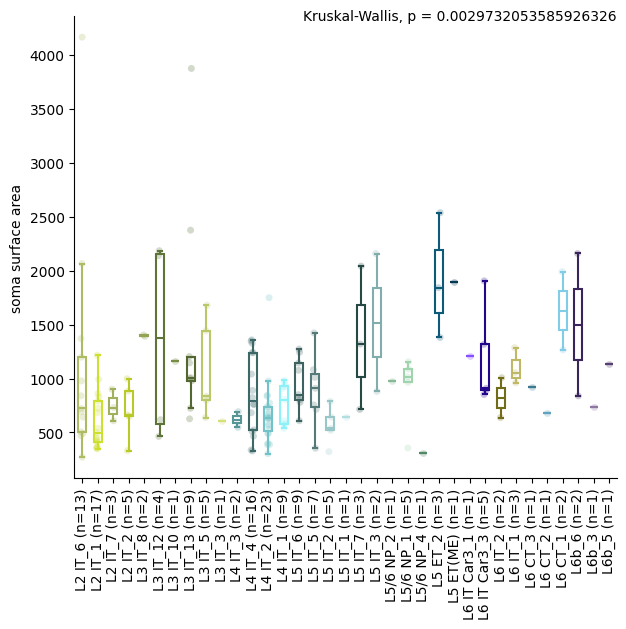

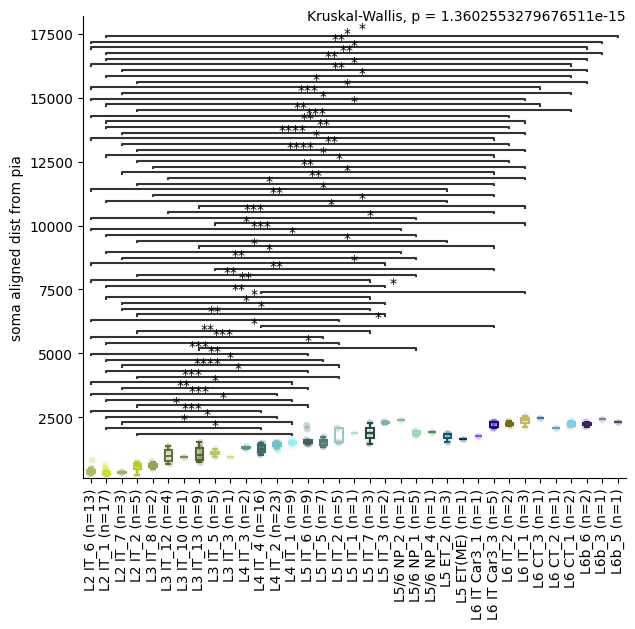

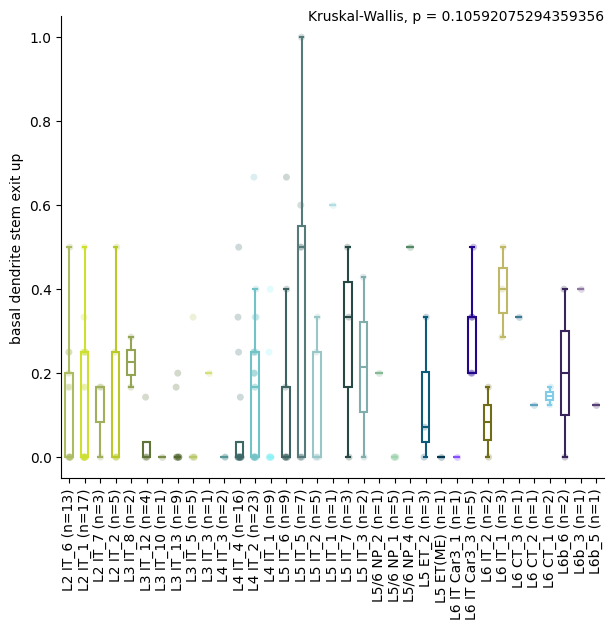

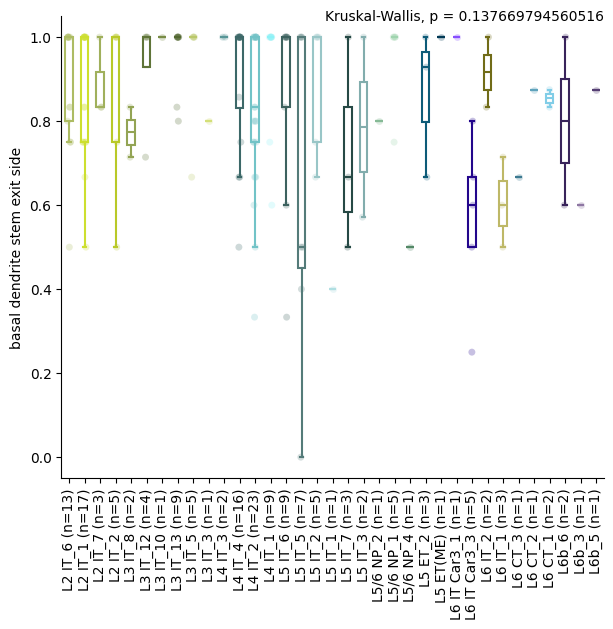

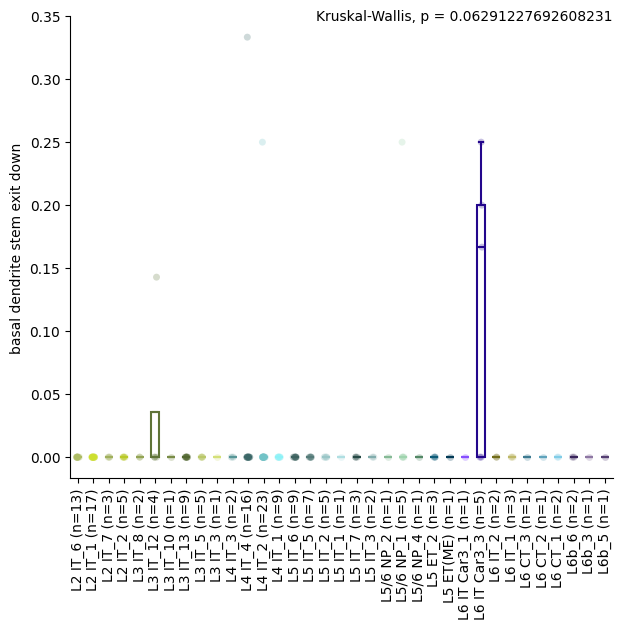

...

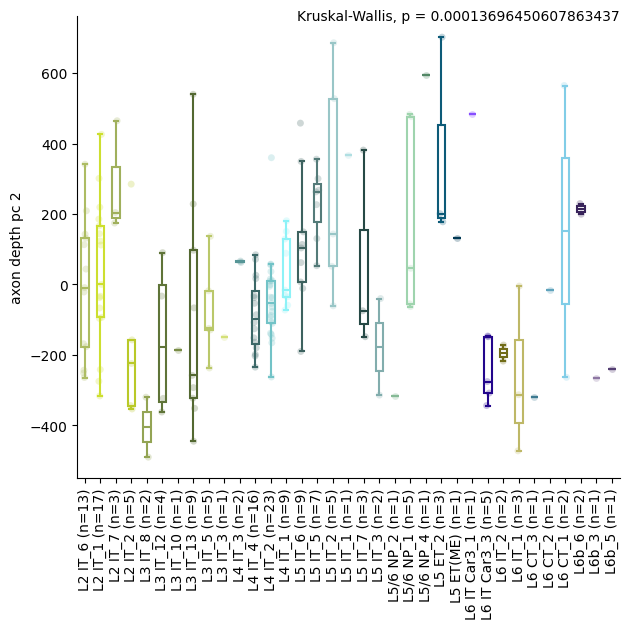

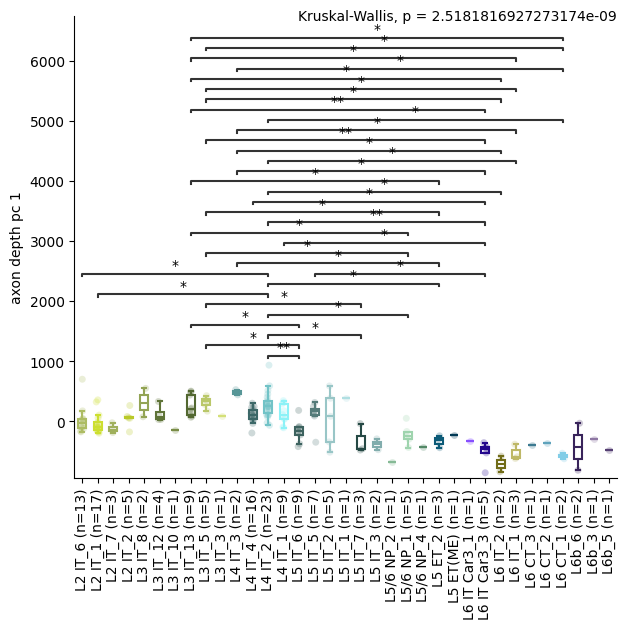

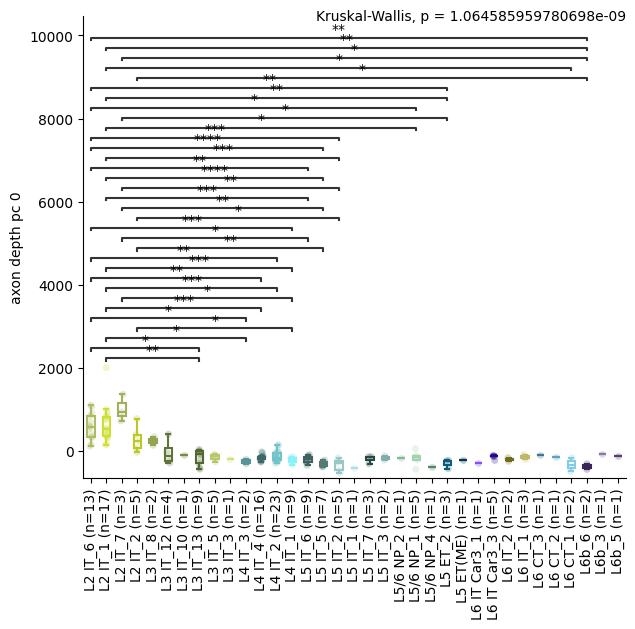

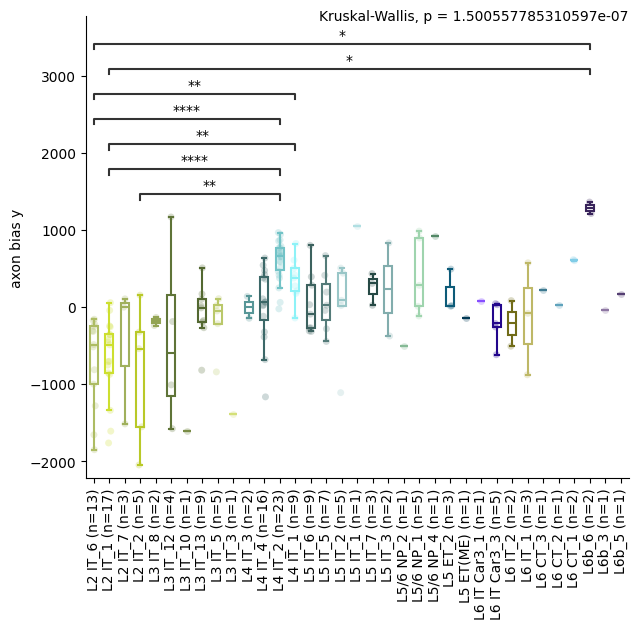

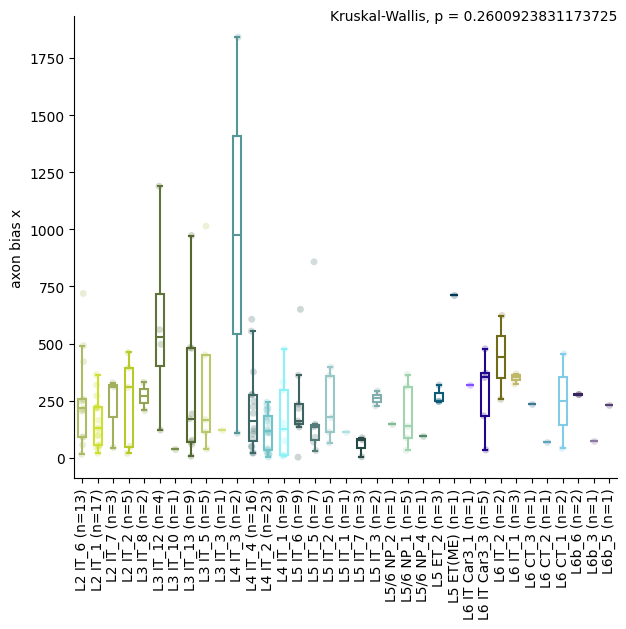

<Figure size 640x480 with 0 Axes>

In [13]:
# subclass x feature box plots

#ADJUST VARS
fig_name = 'human_excitatory_boxplots_axon_features_KW_Dunn_FDR_byTtype.pdf'
color_palette = color_dict #colors for x_var
hue_var = 't_type' #seperate strip plots into these categories 
hue_color_palette = color_dict #color palette for hue_var
##### MAKE SURE TO UPDATE KRUSKAL CALL IN CODE BELOW TO CONTAIN ALL THE X_VAR GROUPS #####

#######################

fig_path = os.path.join(output_dir, fig_name)
features = raw_feature_wide.columns.tolist()[1:]

with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)

    with PdfPages(fig_path) as pdf:
        while features != []:
            
            #one fig per page, each has page (fig) has 4 rows. 
            fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(7,6),sharex=True, gridspec_kw = {'wspace':0, 'hspace':0.1}) #gridspec_kw = {'wspace':0, 'hspace':0},
            # for ax in axes: #plot as many neurons as fit on this page (num_rows rows of plotting)
            
            y_var = features.pop()
            
            sns.stripplot(data=sorted_clean_data, x=x_var, y=y_var, ax=ax, order=x_var_order, palette=color_palette, alpha=0.25)
            # sns.stripplot(data=sorted_clean_data, x=x_var, y=y_var, ax=ax, order=x_var_order, palette=hue_color_palette, alpha=0.25, 
            #                   hue=hue_var, dodge=True, jitter=False) #TODO figure out how to do this with no legend
            # ax.legend_.remove()
            sns.boxplot(data=sorted_clean_data, x=x_var, y=y_var, ax=ax, order=x_var_order, palette=color_palette, saturation=1, showfliers = False, width=0.5)
            format_box_plot(ax) #color line not fill of boxplot


            #add num observations per x_var
            nobs = []
            for t in x_var_order:
                n = len(sorted_clean_data[sorted_clean_data[x_var] == t])
                nobs.append(" (n=%s)" % str(n))
            new_x_tick_labels = [x_var_order[i] + nobs[i] for i in range(len(x_var_order))]  
            ax.set_xticklabels(new_x_tick_labels)

            # add stats (KW w/ Dunn post hoc FDR corrected)

            #plot signif dunn fdr p-vals 
            if y_var in dunn_pvals_fdr.keys(): 
                #kw fdr val was signif so there are dunn fdr vals to plot
                
                this_dunn_pvals_fdr = dunn_pvals_fdr[y_var]
                remove = np.tril(np.ones(this_dunn_pvals_fdr.shape), k=0).astype("bool")
                this_dunn_pvals_fdr[remove] = np.nan
                dunn_pvals_fdr_melt = this_dunn_pvals_fdr.melt(ignore_index=False).reset_index().dropna()

                #set insignificant pvals to nan 
                p_thresh = 0.05 #threshold for plotting p vals 
                dunn_pvals_fdr_melt.drop(dunn_pvals_fdr_melt[dunn_pvals_fdr_melt['value'] > p_thresh].index, inplace = True)

                #plot bar for all signif fdr corrected dunn p vals 
                pairs = [(i[1]["index"], i[1]["variable"]) for i in dunn_pvals_fdr_melt.iterrows()]
                if len(pairs): 
                    #there's at least one pair of x_vals for which fdr corrected dunn test is signif
                    p_values = [i[1]["value"] for i in dunn_pvals_fdr_melt.iterrows()]                    
                    annotator = Annotator(ax, pairs, data=sorted_clean_data, x=x_var, y=y_var, order=x_var_order)
                    annotator.configure(text_format="star", loc="inside") #text_format="simple"
                    annotator.set_pvalues_and_annotate(p_values)
                    
            #plot Kruskal-Wallis fdr p-vals
            if y_var in kw_pvals_fdr.keys():
                xlimit = ax.get_xlim()
                ylimit = ax.get_ylim()
                p_txt = 'Kruskal-Wallis, p = ' + str(kw_pvals_fdr[y_var])
                ax.text(xlimit[1], ylimit[1], p_txt, verticalalignment='center', horizontalalignment='right')

            #rotate and format x_var labels 
            ax.set(xlabel=None)
            ax.tick_params(axis='x', rotation=90)
            ax.set_ylabel(y_var.replace("_", " "), rotation=90)
            ax.spines[['right', 'top']].set_visible(False)

            fig.subplots_adjust(wspace=0, hspace=0.0)
            pdf.savefig(dpi=600, bbox_inches='tight')
        plt.show()
        plt.clf()
        print()



T-Types within each Layer x feature box plots with stats

In [6]:
#ttypes within each layer

ttype_order = group_order['t_type']
features = raw_feature_wide.columns.tolist()[1:]

# layer x feature stats
layer_var = 'layer' #what to do box plots on 
layer_var_order = group_order[layer_var]

kw_pvals_fdr_layer = dict()
dunn_pvals_fdr_layer = dict()
for layer in layer_var_order:
    print(layer)
    layer_data = sorted_clean_data.loc[sorted_clean_data[layer_var] == layer]

    #now run stats on the ttypes in this layer 
    x_var = 't_type'  # what to do box plots on
    x_var_order = [t for t in ttype_order if t in layer_data[x_var].unique()]

    # Kruskal-Wallis H test on all features
    kw_hvals = dict()
    kw_pvals = dict()
    for f in features:
        # Create a list of groups dynamically
        groups = [layer_data.loc[layer_data[x_var] == x][f].dropna() for x in x_var_order]
        
        # Only include groups that have data
        groups = [group for group in groups if not group.empty]

        if len(groups) < 2:
            print(f"Not enough groups with data for feature {f}")
            continue
        try:
            hvalue, pvalue = kruskal(*groups, nan_policy='omit')
            kw_hvals[f] = hvalue
            kw_pvals[f] = pvalue
        except ValueError as e:
            print(f'Kruskal-Wallis not calculated for {f} because of an error: {e}')

    # FDR correction
    kw_pvals_list = list(kw_pvals.values())
    kw_rejected_list, kw_pvals_fdr_list = fdrcorrection(kw_pvals_list, alpha=0.05, method='indep', is_sorted=False)

    kw_pvals_fdr = dict(zip(list(kw_pvals.keys()), list(kw_pvals_fdr_list)))
    kw_rejected = dict(zip(list(kw_pvals.keys()), list(kw_rejected_list)))

    # Post Hoc Dunn test for significant KW features, with FDR correction
    dunn_pvals_fdr = dict()
    for k, v in kw_rejected.items():
        if v:  # if null hypothesis was rejected, calculate Dunn post hoc
            dunn_pvals_fdr[k] = posthoc_dunn(layer_data[layer_data[x_var].isin(x_var_order)], val_col=k, group_col=x_var, p_adjust='fdr_bh', sort=True)

    kw_pvals_fdr_layer[layer] = kw_pvals_fdr
    dunn_pvals_fdr_layer[layer] = dunn_pvals_fdr

Layer 2
Kruskal-Wallis not calculated for basal_dendrite_stem_exit_down because of an error: All numbers are identical in kruskal
Layer 3
Layer 4
Layer 5
Layer 6


In [7]:
#Save stats
rows = []

for layer in layer_var_order:
    kw_dict = kw_pvals_fdr_layer.get(layer, {})
    dunn_dict = dunn_pvals_fdr_layer.get(layer, {})
    
    for feature, kw_p in kw_dict.items():
        # if Dunn exists for this feature
        if feature in dunn_dict:
            dunn_df = dunn_dict[feature]
            # Flatten Dunn results: pairwise comparisons
            for i in dunn_df.index:
                for j in dunn_df.columns:
                    if i != j:  # skip self-comparison
                        rows.append({
                            'layer': layer,
                            'feature': feature,
                            'kw_pval_fdr': kw_p,
                            'group1': i,
                            'group2': j,
                            'dunn_pval_fdr': dunn_df.loc[i, j]
                        })
        else:
            # No post-hoc, just KW
            rows.append({
                'layer': layer,
                'feature': feature,
                'kw_pval_fdr': kw_p,
                'group1': None,
                'group2': None,
                'dunn_pval_fdr': None
            })

# Convert to DataFrame
stats_df = pd.DataFrame(rows)
stats_df.to_csv(os.path.join(output_dir, r'morphology_axon_feature_box_plot_stats_supertypes_within_layer.csv'), index=False)
stats_df

,layer,feature,kw_pval_fdr,group1,group2,dunn_pval_fdr
0,Layer 2,axon_bias_x,0.852856,None,None,NaN
1,Layer 2,axon_bias_y,0.863885,None,None,NaN
2,Layer 2,axon_depth_pc_0,0.339043,None,None,NaN
3,Layer 2,axon_depth_pc_1,0.622870,None,None,NaN
4,Layer 2,axon_depth_pc_2,0.339043,None,None,NaN
...,...,...,...,...,...,...
191,Layer 6,basal_dendrite_stem_exit_down,0.579287,None,None,NaN
192,Layer 6,basal_dendrite_stem_exit_side,0.579287,None,None,NaN
193,Layer 6,basal_dendrite_stem_exit_up,0.579287,None,None,NaN
194,Layer 6,soma_aligned_dist_from_pia,0.579287,None,None,NaN


In [12]:
print(output_dir)

\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\analysis\20251201_seaad\axon


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users

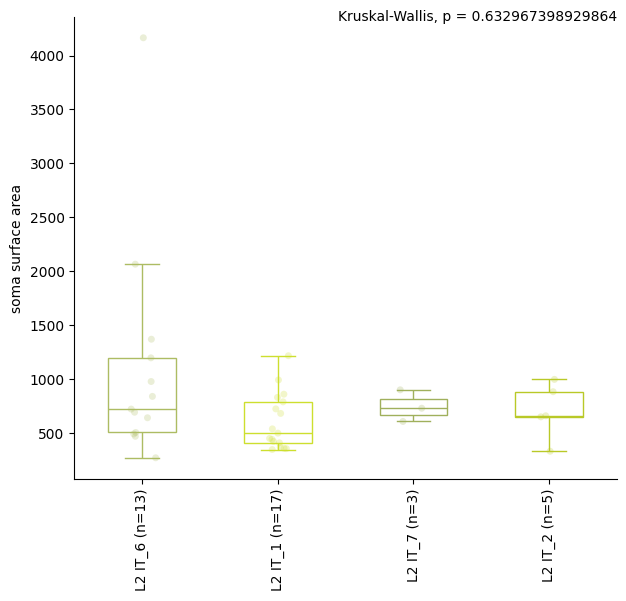

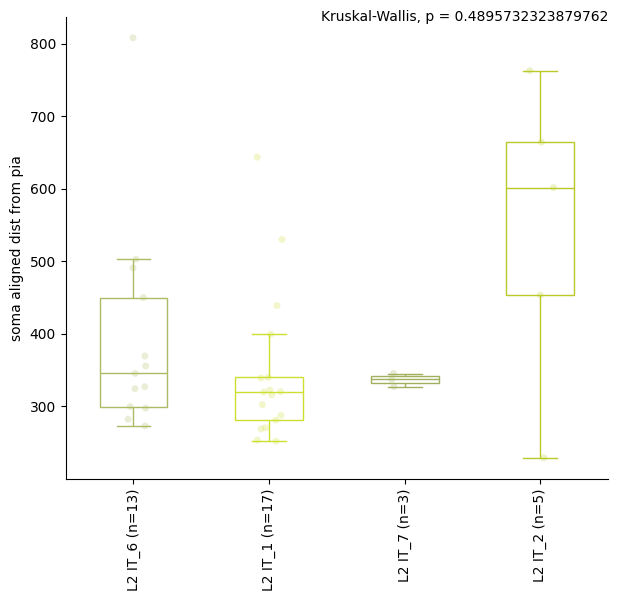

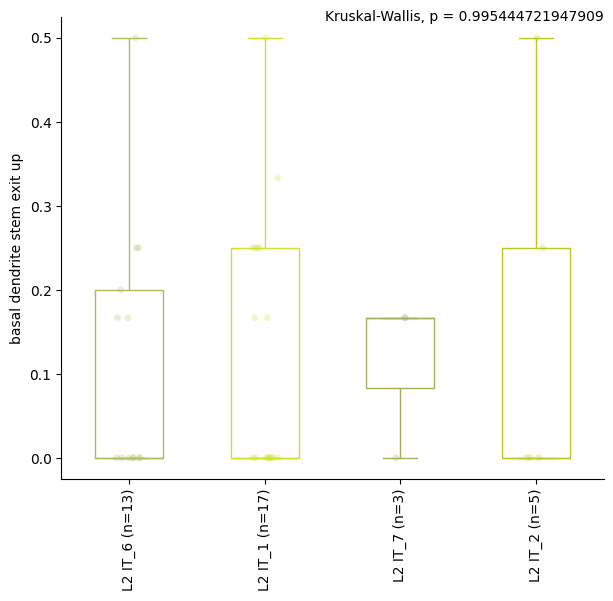

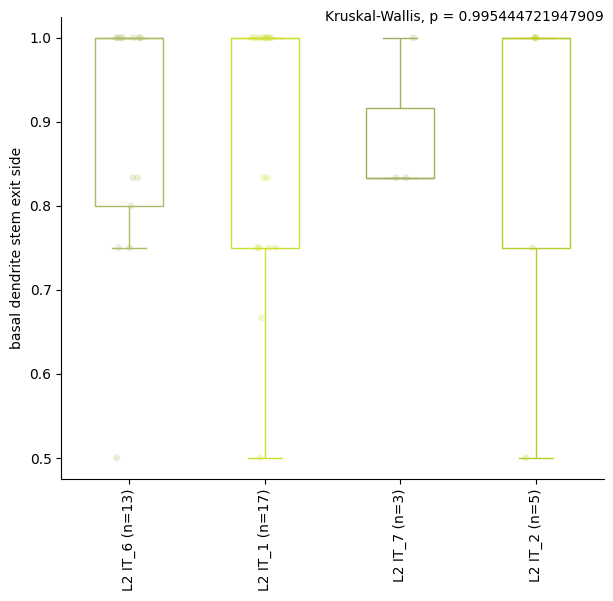

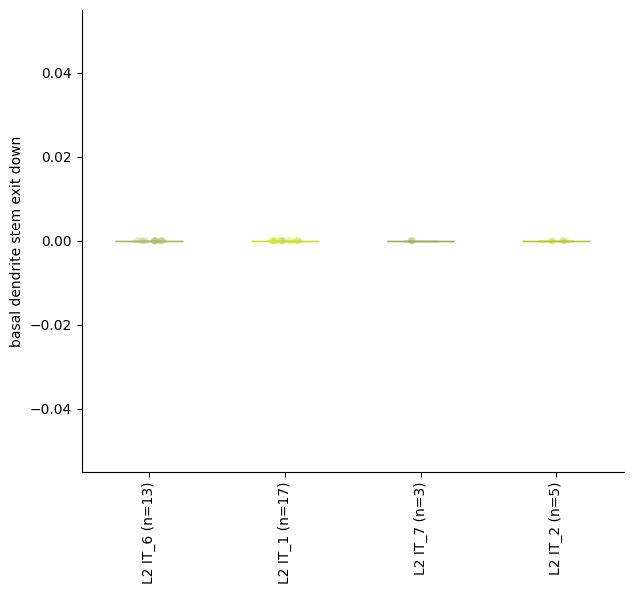

...

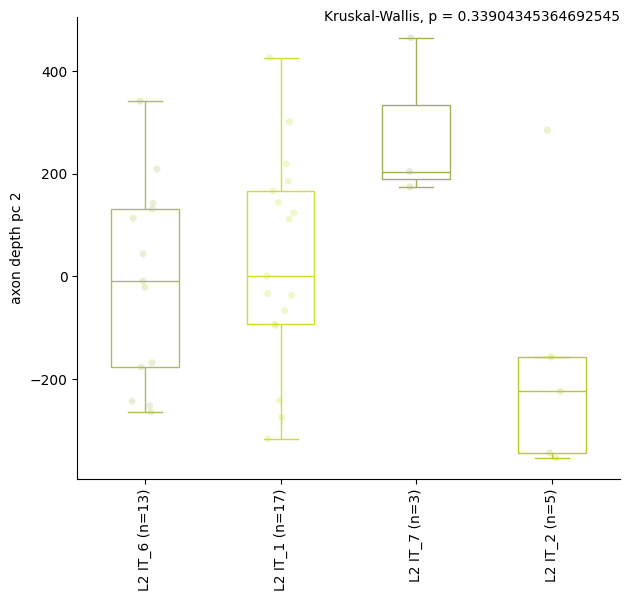

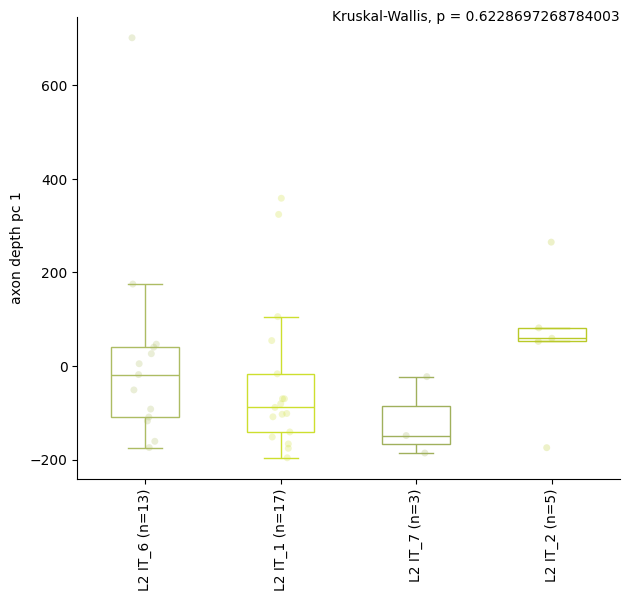

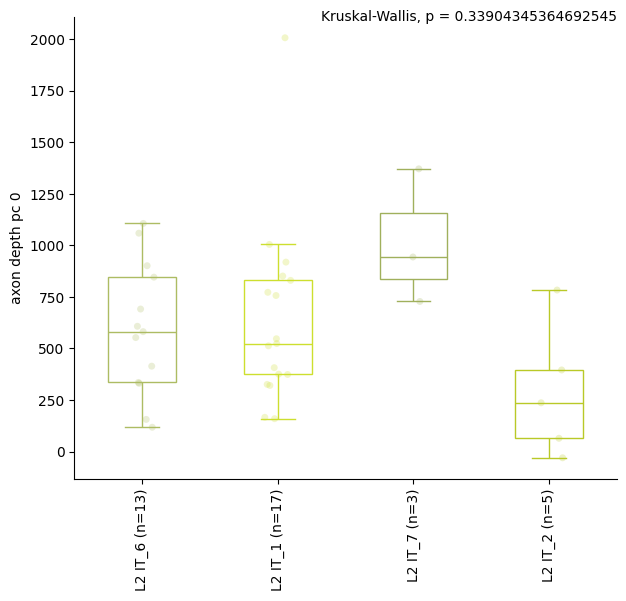

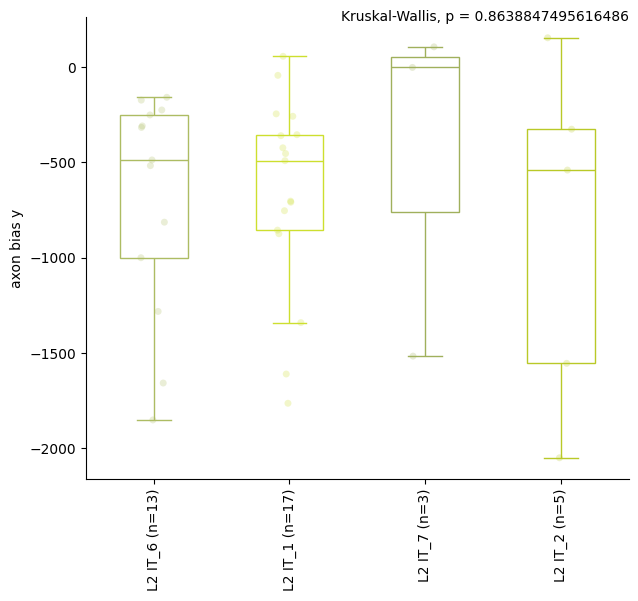

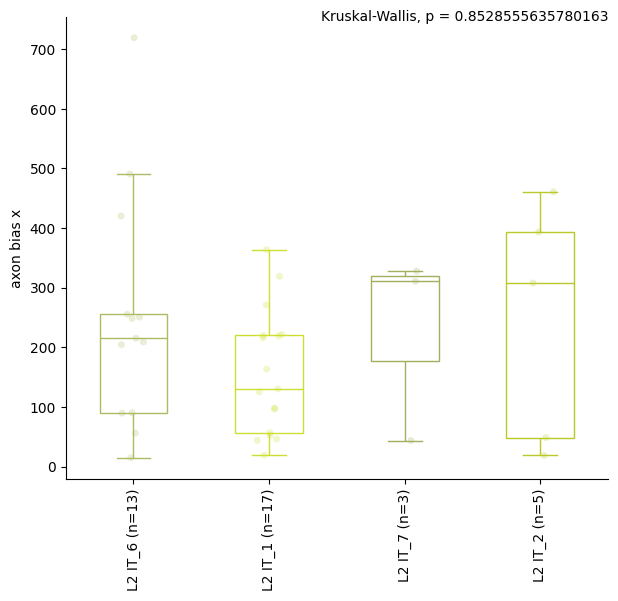

C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users

<Figure size 640x480 with 0 Axes>

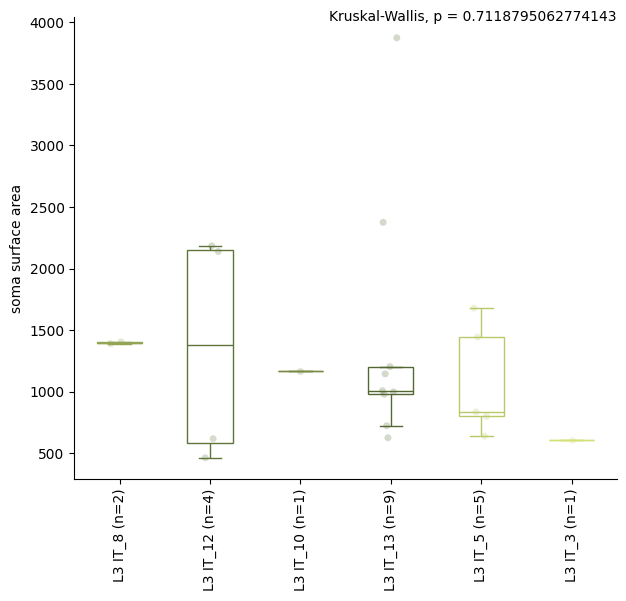

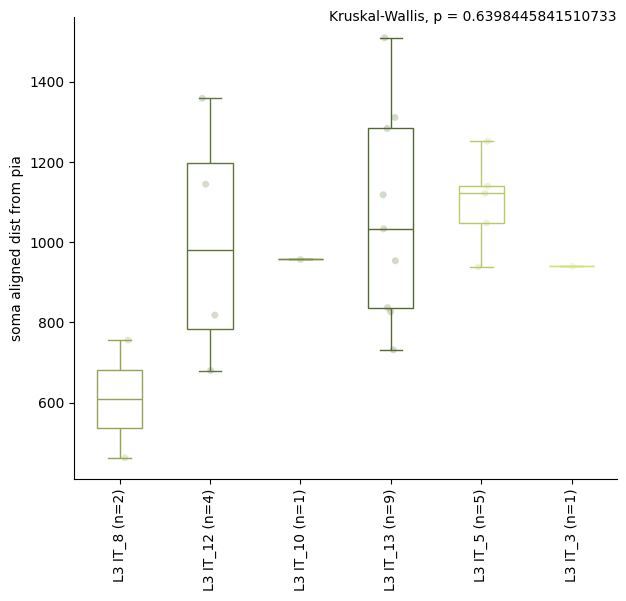

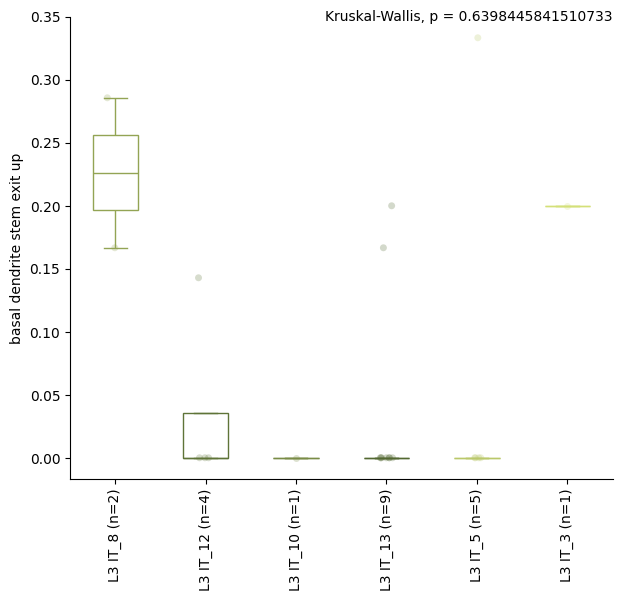

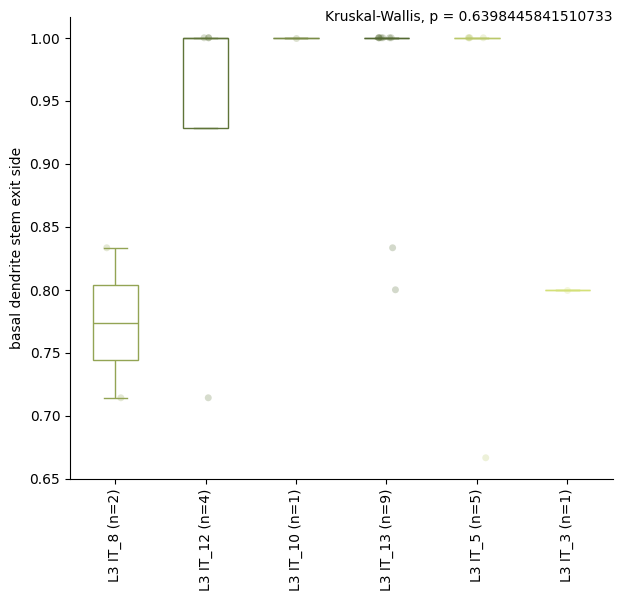

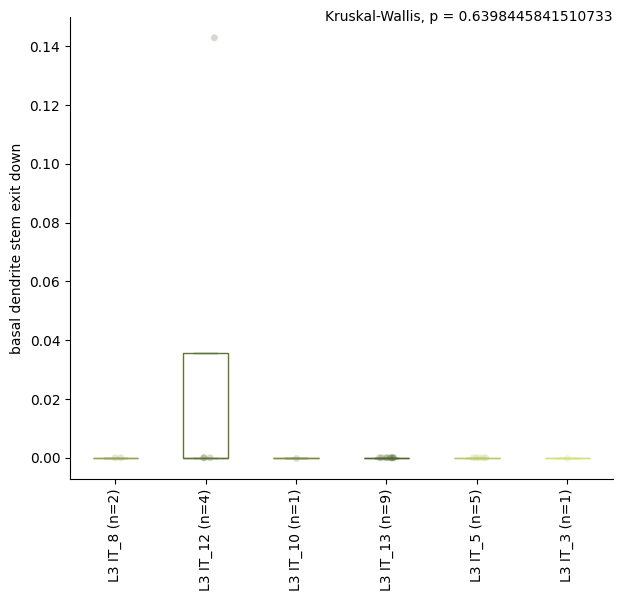

...

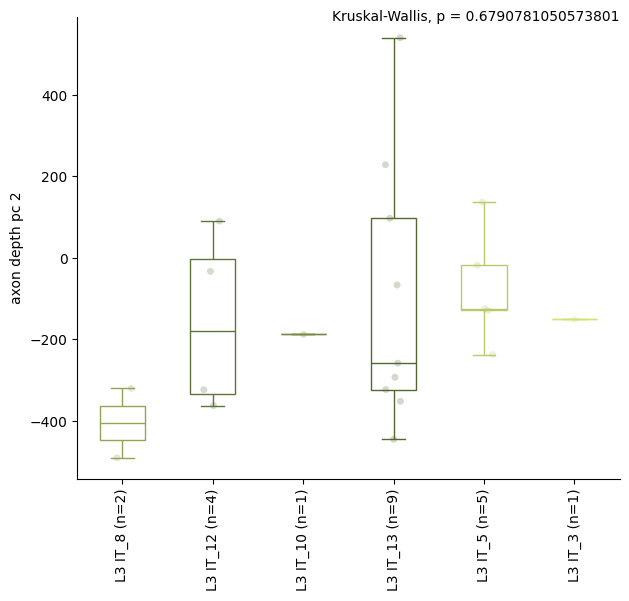

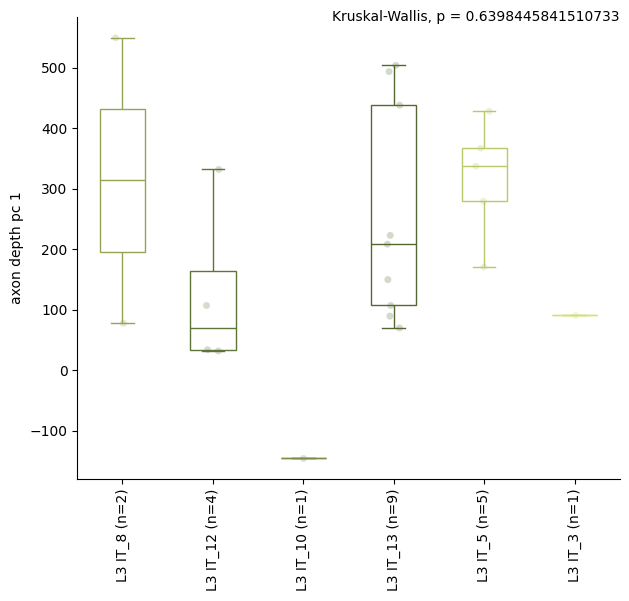

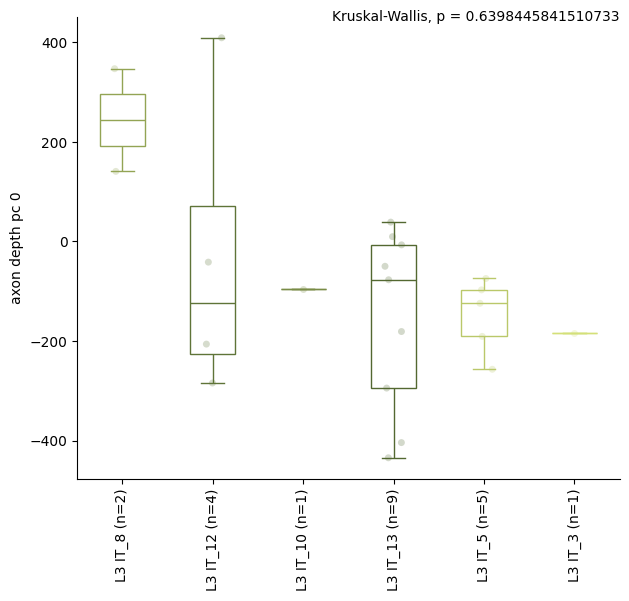

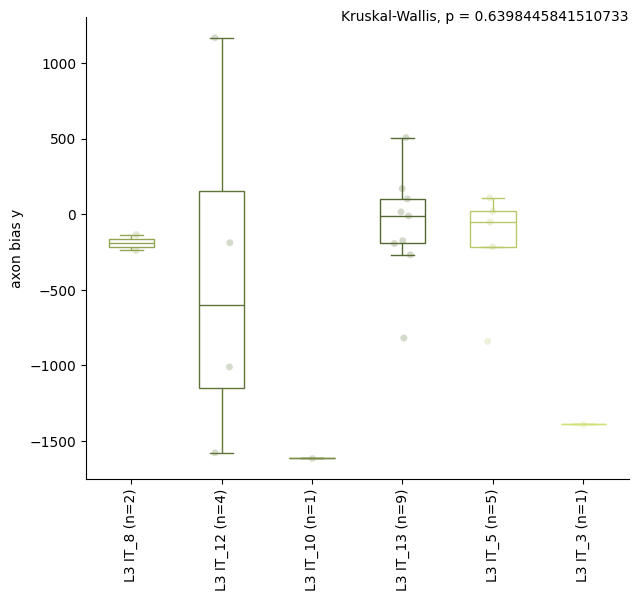

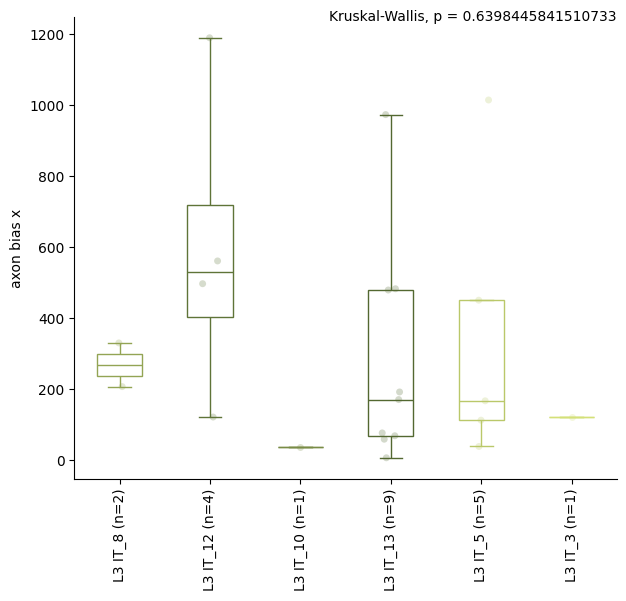

C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L4 IT_2 vs. L4 IT_1: Custom statistical test, P_val:2.760e-02
L4 IT_4 vs. L4 IT_2: Custom statistical test, P_val:1.192e-02
L4 IT_4 vs. L4 IT_1: Custom statistical test, P_val:4.585e-05
L4 IT_3 vs. L4 IT_1: Custom statistical test, P_val:2.443e-02


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L4 IT_4 vs. L4 IT_2: Custom statistical test, P_val:9.728e-06


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L4 IT_2 vs. L4 IT_1: Custom statistical test, P_val:4.399e-02
L4 IT_4 vs. L4 IT_2: Custom statistical test, P_val:4.399e-02
L4 IT_3 vs. L4 IT_4: Custom statistical test, P_val:4.399e-02
L4 IT_3 vs. L4 IT_1: Custom statistical test, P_val:4.399e-02


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L4 IT_4 vs. L4 IT_2: Custom statistical test, P_val:9.024e-03
L4 IT_3 vs. L4 IT_4: Custom statistical test, P_val:9.024e-03


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L4 IT_2 vs. L4 IT_1: Custom statistical test, P_val:1.468e-02
L4 IT_4 vs. L4 IT_2: Custom statistical test, P_val:4.335e-03


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L4 IT_4 vs. L4 IT_2: Custom statistical test, P_val:2.652e-02
L4 IT_3 vs. L4 IT_4: Custom statistical test, P_val:2.652e-02
L4 IT_3 vs. L4 IT_1: Custom statistical test, P_val:4.922e-02


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L4 IT_4 vs. L4 IT_2: Custom statistical test, P_val:1.450e-04


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)


<Figure size 640x480 with 0 Axes>

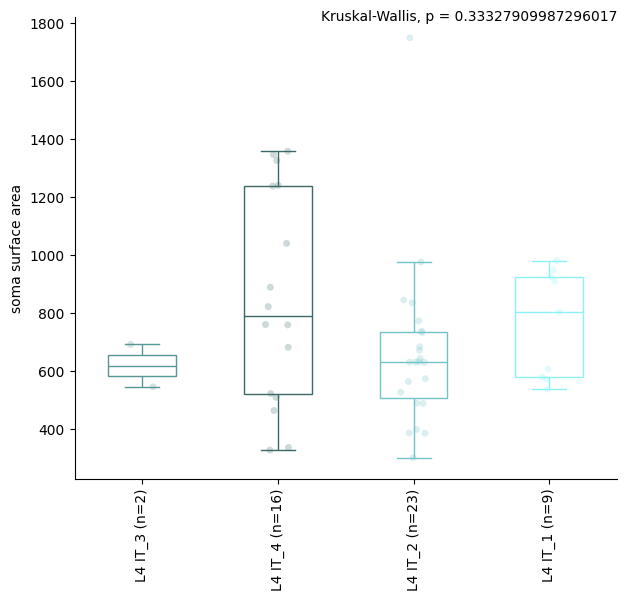

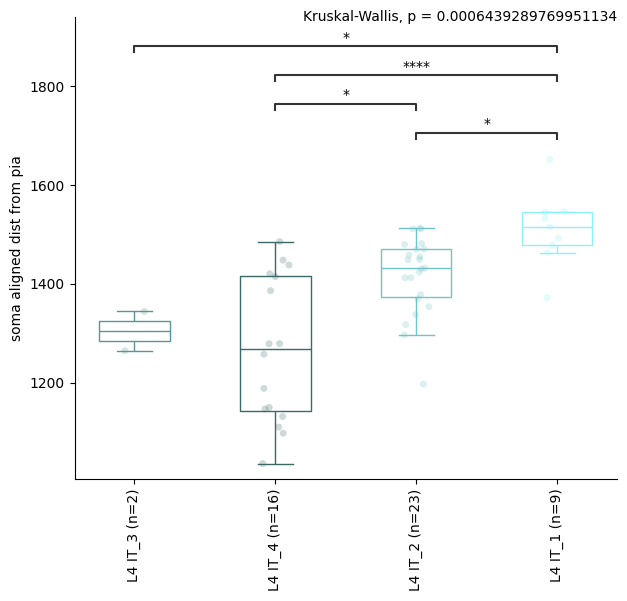

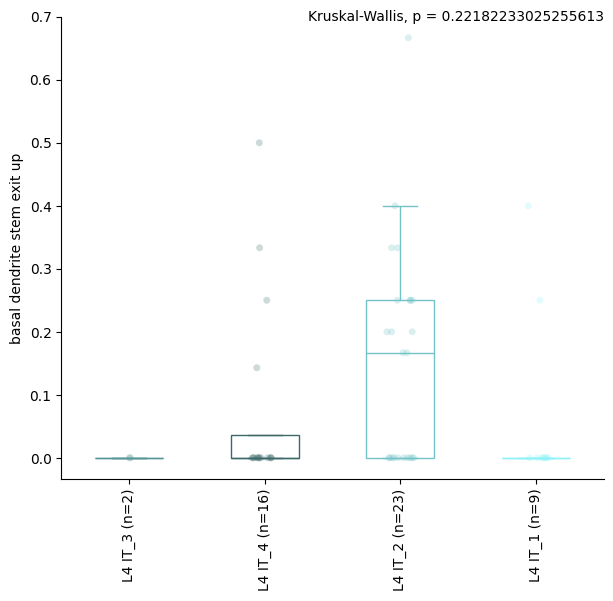

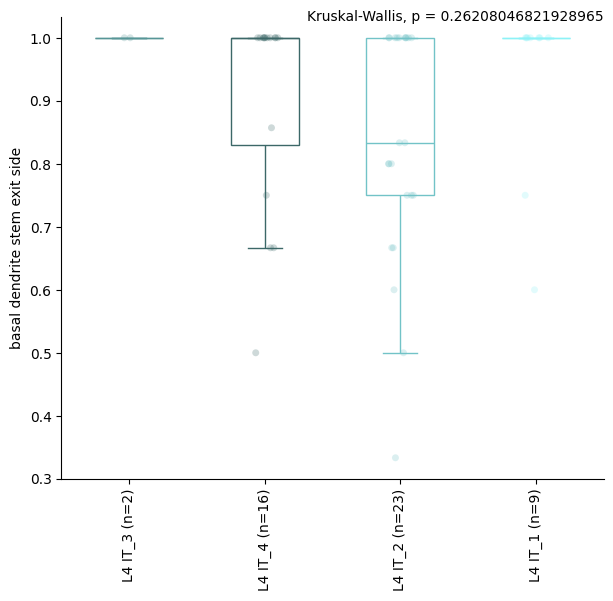

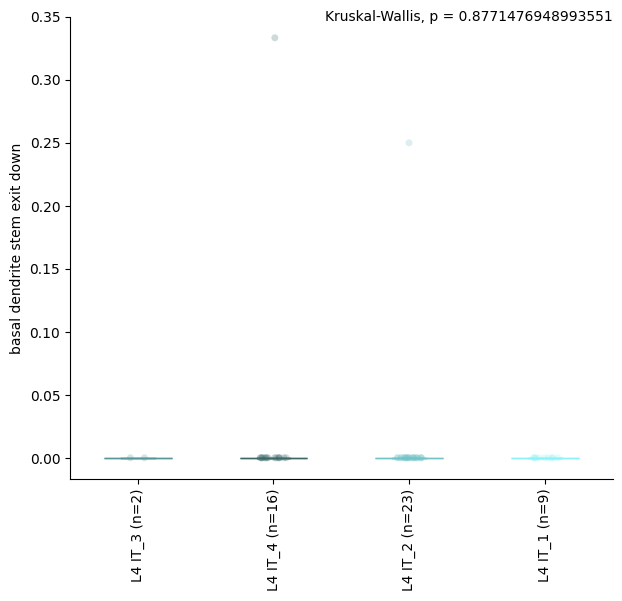

...

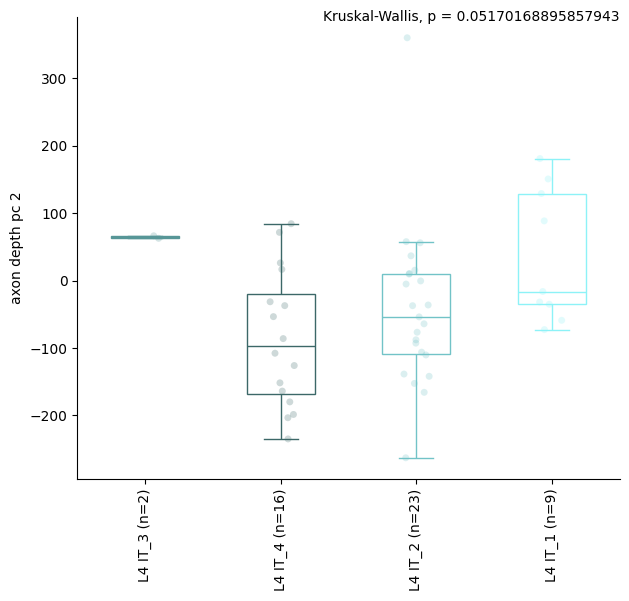

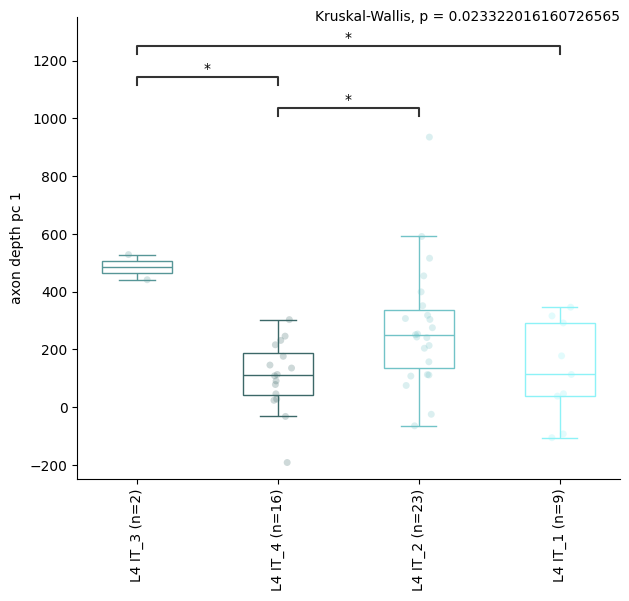

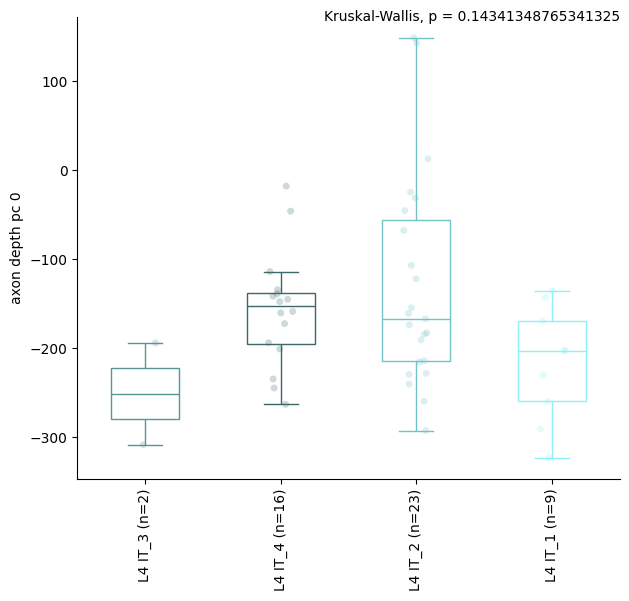

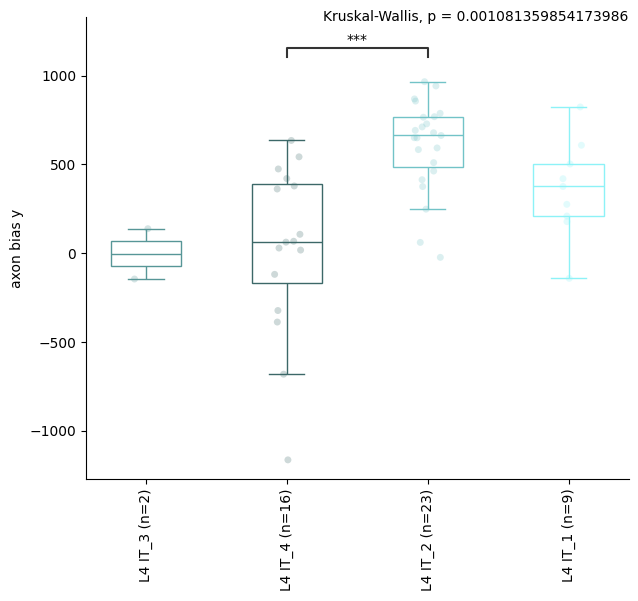

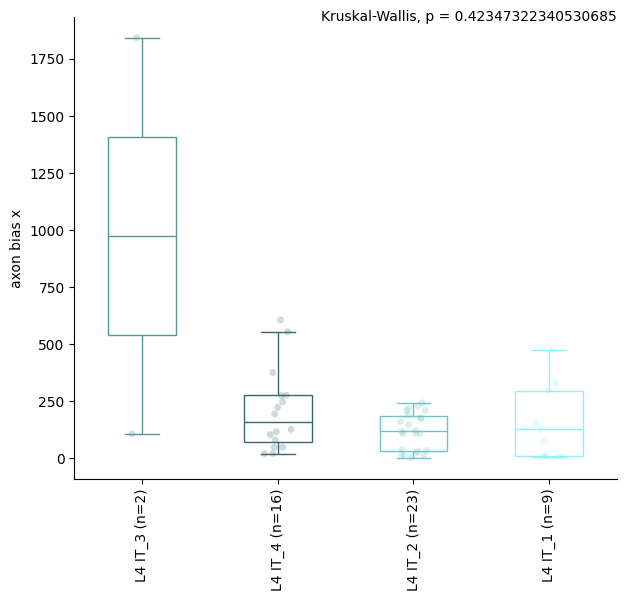

C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users

<Figure size 640x480 with 0 Axes>

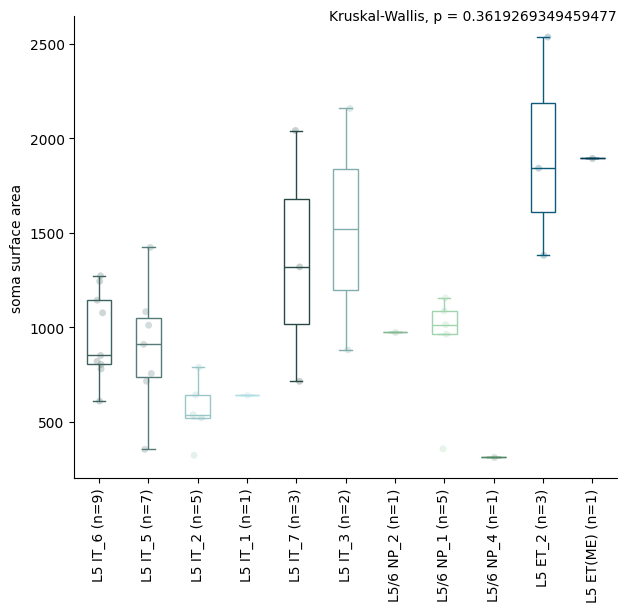

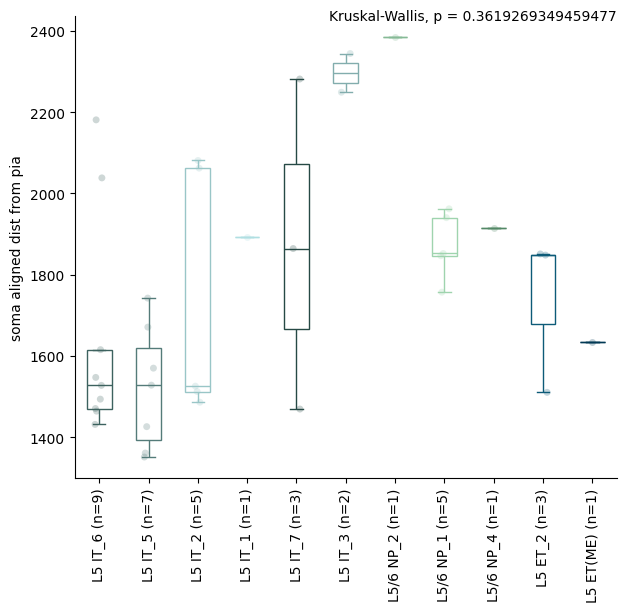

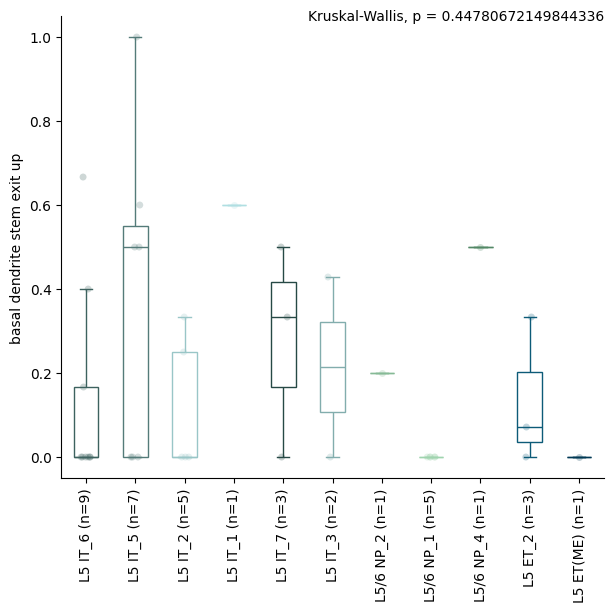

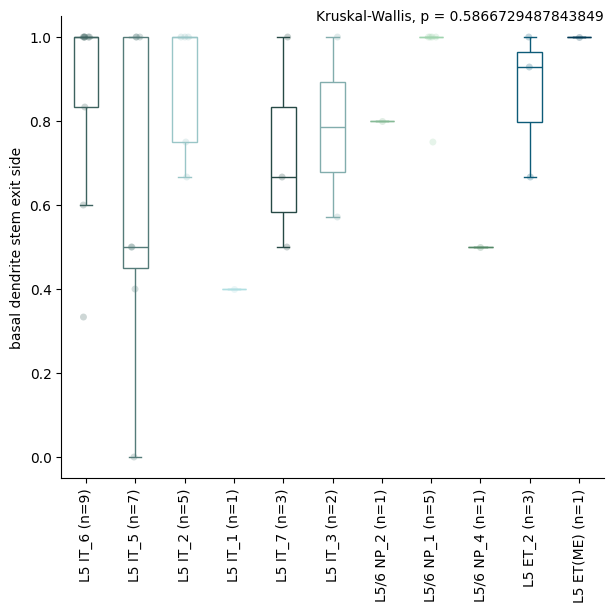

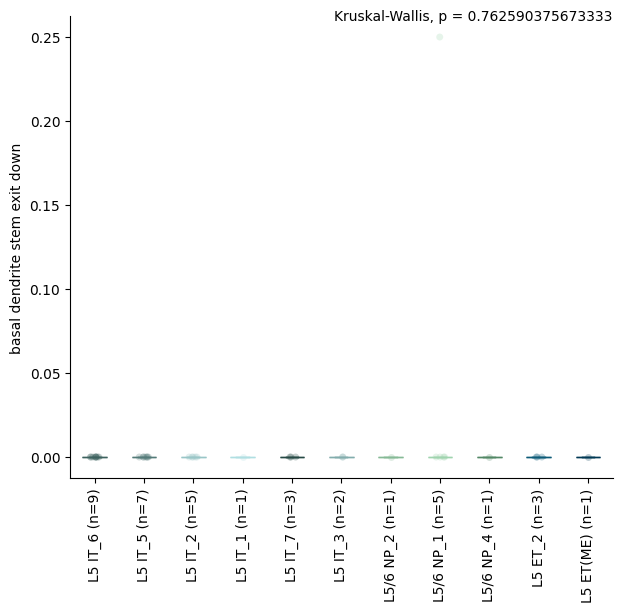

...

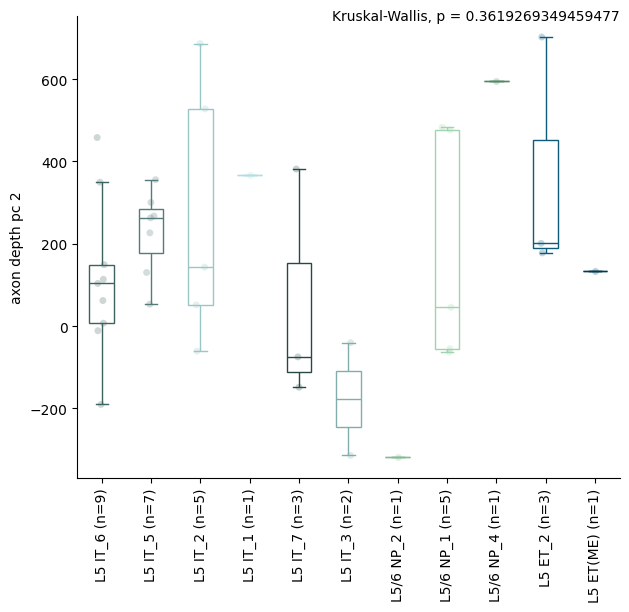

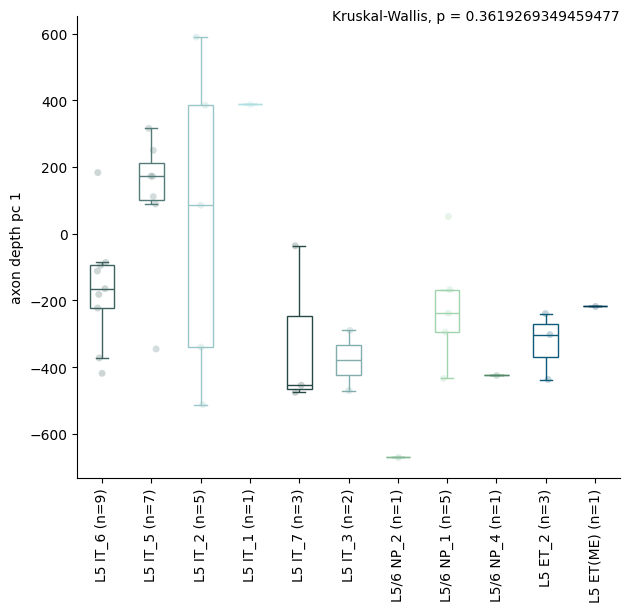

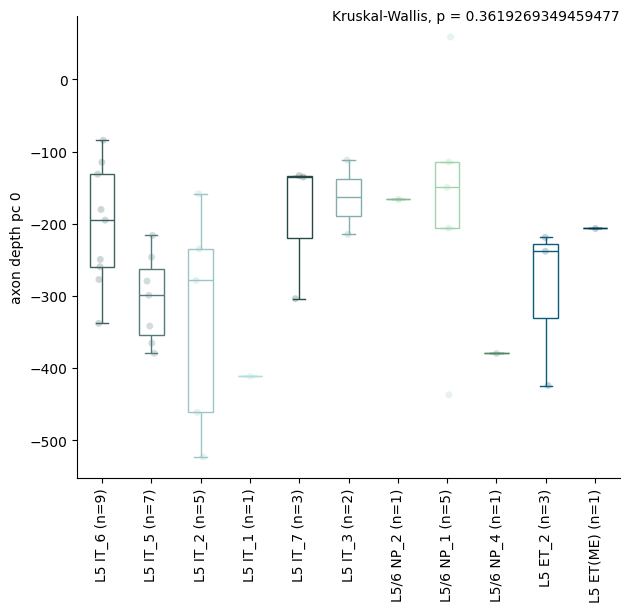

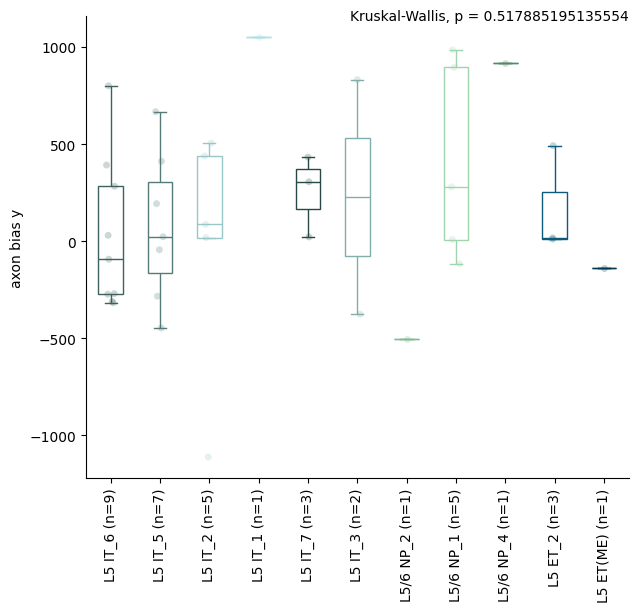

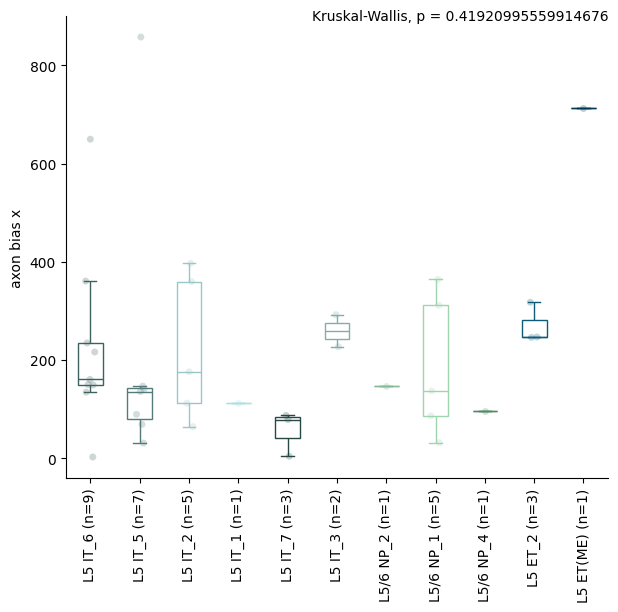

C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_12796\3090287462.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_x_tick_labels)
C:\Users

<Figure size 640x480 with 0 Axes>

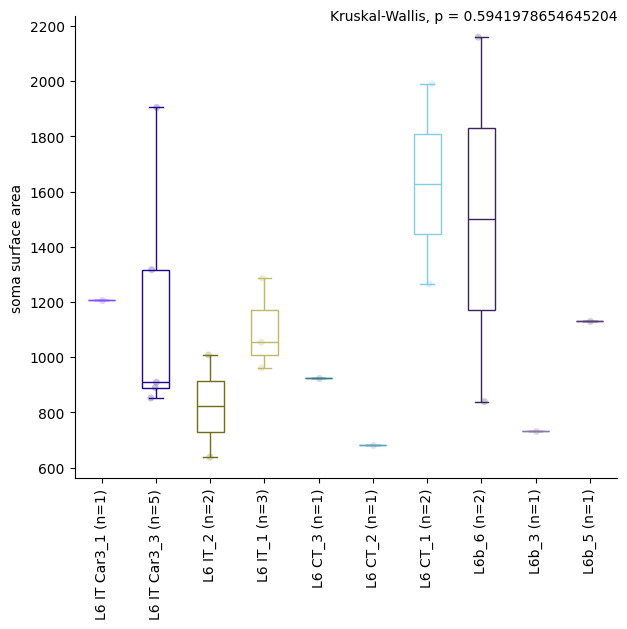

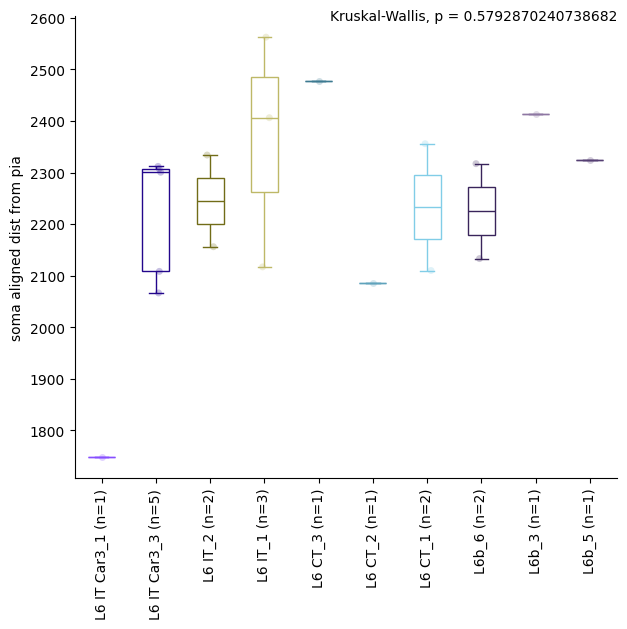

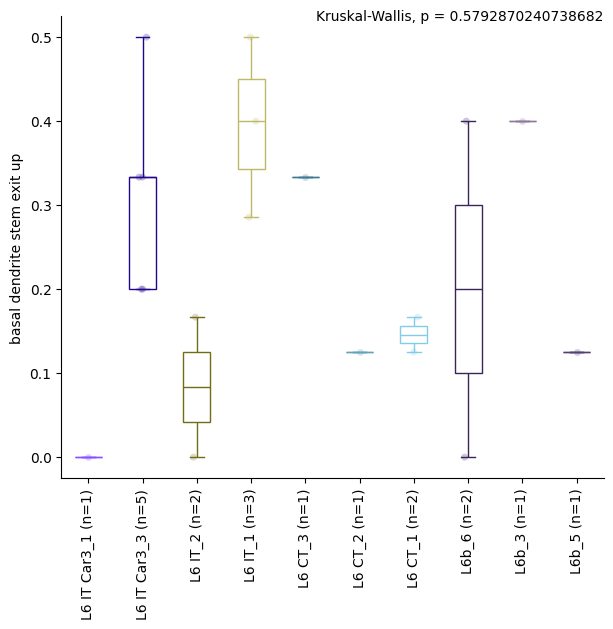

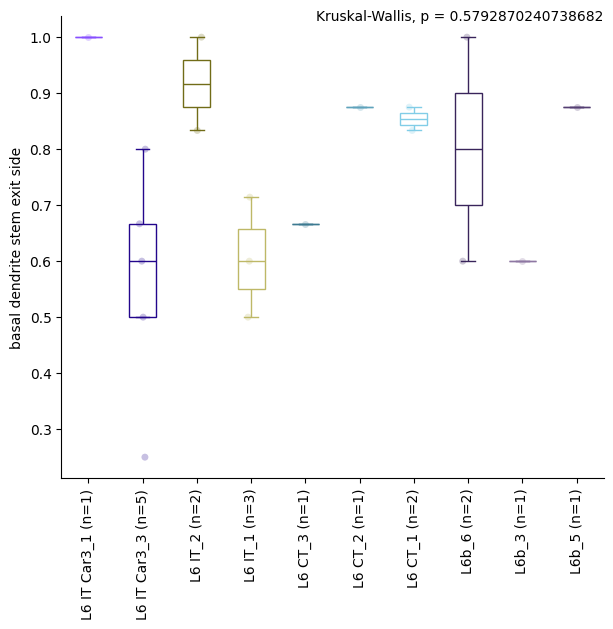

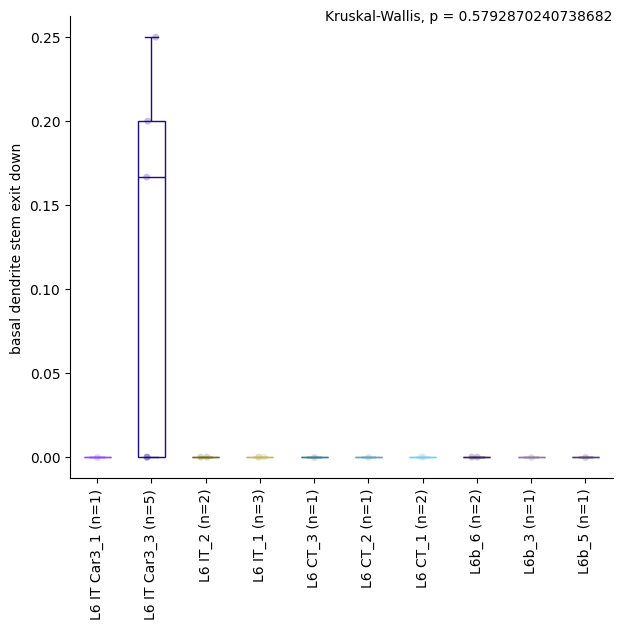

...

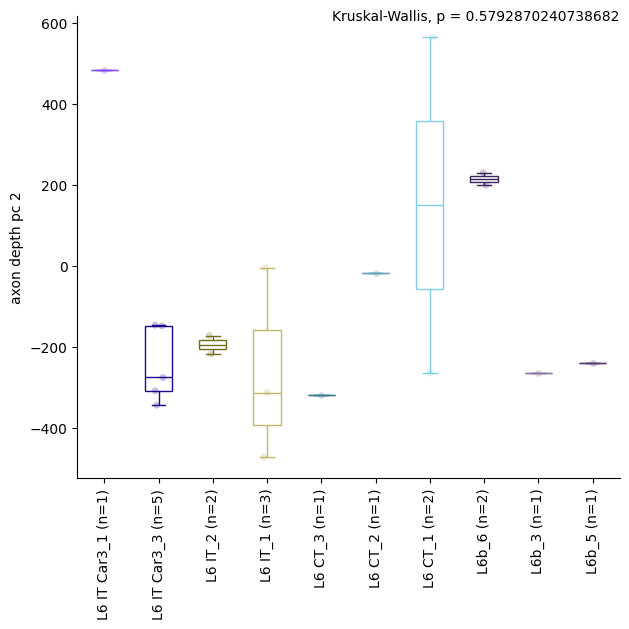

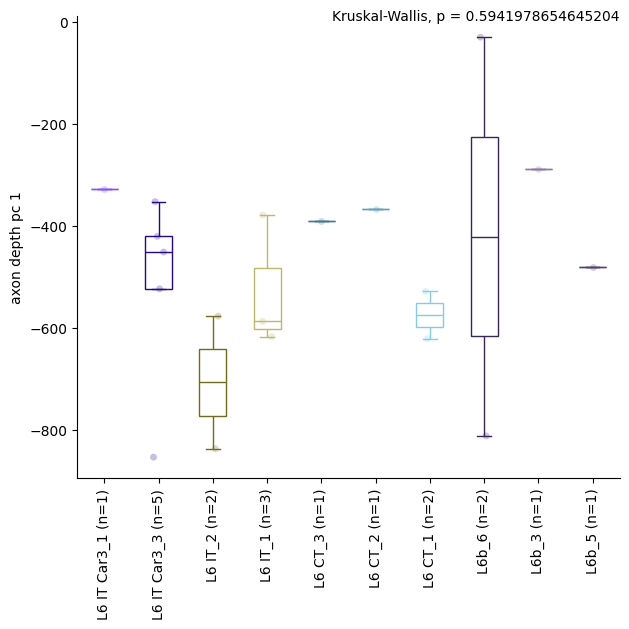

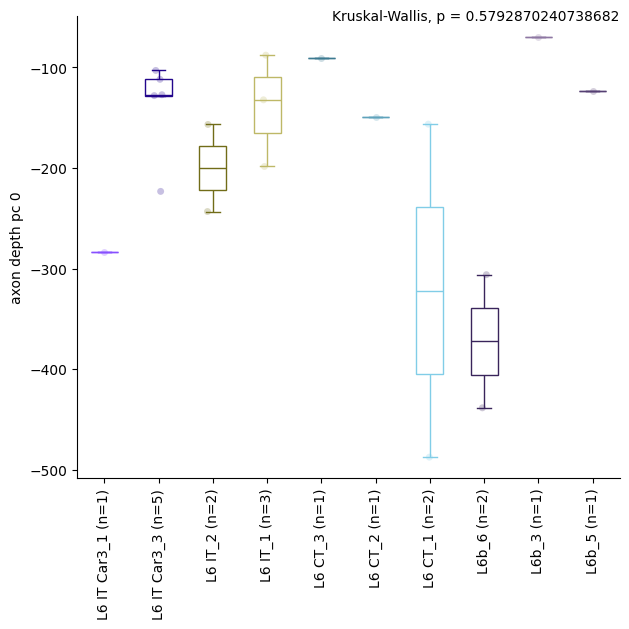

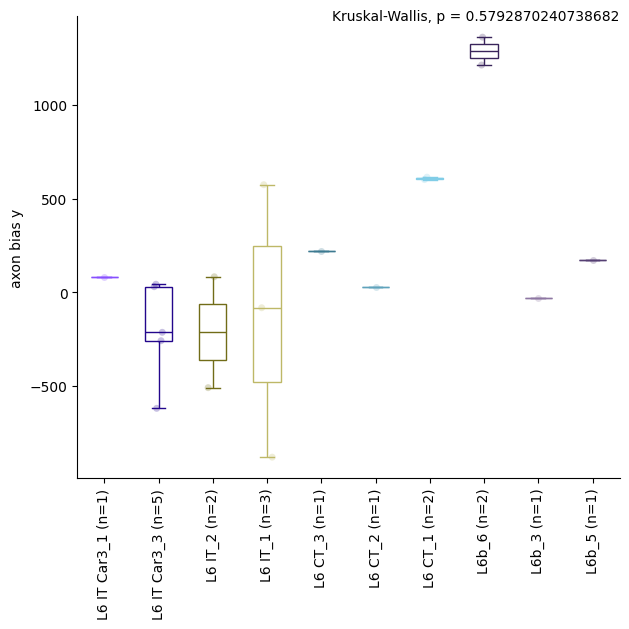

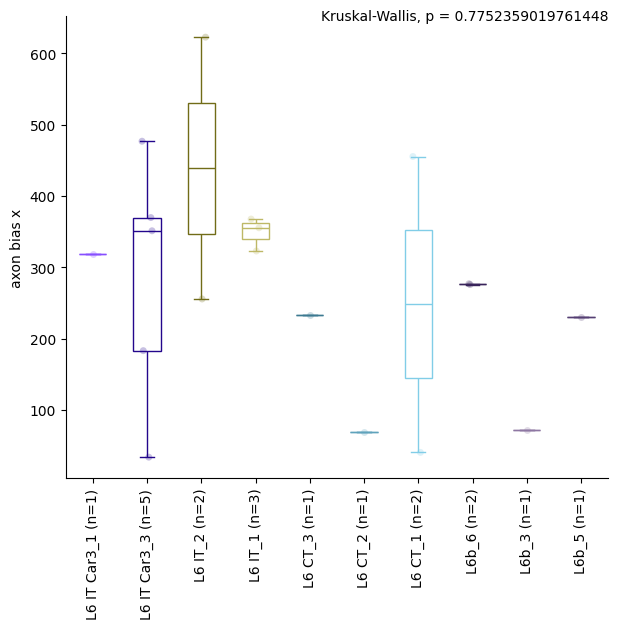

<Figure size 640x480 with 0 Axes>

In [12]:
# ttype x feature box plots

ttype_order = group_order['t_type']

for layer in kw_pvals_fdr_layer.keys():
    if kw_pvals_fdr_layer[layer]:
        #layer has results (there were enough ttypes in the layer, etc.)
        layer_data = sorted_clean_data.loc[sorted_clean_data[layer_var] == layer]
        kw_pvals_fdr = kw_pvals_fdr_layer[layer]  
        dunn_pvals_fdr = dunn_pvals_fdr_layer[layer]
        x_var = 't_type'  # what to do box plots on
        x_var_order = [t for t in ttype_order if t in layer_data[x_var].unique()]

        #ADJUST VARS
        fig_name = 'human_excitatory_boxplots_axon_features_KW_Dunn_FDR_{}_byTtype.pdf'.format(layer.replace('/', '-').replace(' ', '_'))
        color_palette = color_dict #colors for x_var
        hue_var = 't_type' #seperate strip plots into these categories 
        hue_color_palette = color_dicts[hue_var] #color palette for hue_var
        ##### MAKE SURE TO UPDATE KRUSKAL CALL IN CODE BELOW TO CONTAIN ALL THE X_VAR GROUPS #####

        #######################

        fig_path = os.path.join(output_dir, fig_name)
        features = raw_feature_wide.columns.tolist()[1:]

        with warnings.catch_warnings():
            warnings.simplefilter(action='ignore', category=FutureWarning)

            with PdfPages(fig_path) as pdf:
                while features != []:
                    
                    #one fig per page, each has page (fig) has 4 rows. 
                    fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(7,6),sharex=True, gridspec_kw = {'wspace':0, 'hspace':0.1}) #gridspec_kw = {'wspace':0, 'hspace':0},
                    # for ax in axes: #plot as many neurons as fit on this page (num_rows rows of plotting)
                    
                    y_var = features.pop()
                    
                    sns.stripplot(data=layer_data, x=x_var, y=y_var, ax=ax, order=x_var_order, palette=color_palette, alpha=0.25)
                    sns.boxplot(data=layer_data, x=x_var, y=y_var, ax=ax, order=x_var_order, palette=color_palette, saturation=1, showfliers = False, width=0.5)
                    format_box_plot(ax) #color line not fill of boxplot


                    #add num observations per x_var
                    nobs = []
                    for t in x_var_order:
                        n = len(layer_data[layer_data[x_var] == t])
                        nobs.append(" (n=%s)" % str(n))
                    new_x_tick_labels = [x_var_order[i] + nobs[i] for i in range(len(x_var_order))]  
                    ax.set_xticklabels(new_x_tick_labels)

                    # add stats (KW w/ Dunn post hoc FDR corrected)

                    #plot signif dunn fdr p-vals 
                    if y_var in dunn_pvals_fdr.keys(): 
                        #kw fdr val was signif so there are dunn fdr vals to plot
                        
                        this_dunn_pvals_fdr = dunn_pvals_fdr[y_var]
                        remove = np.tril(np.ones(this_dunn_pvals_fdr.shape), k=0).astype("bool")
                        this_dunn_pvals_fdr[remove] = np.nan
                        dunn_pvals_fdr_melt = this_dunn_pvals_fdr.melt(ignore_index=False).reset_index().dropna()

                        #set insignificant pvals to nan 
                        p_thresh = 0.05 #threshold for plotting p vals 
                        dunn_pvals_fdr_melt.drop(dunn_pvals_fdr_melt[dunn_pvals_fdr_melt['value'] > p_thresh].index, inplace = True)

                        #plot bar for all signif fdr corrected dunn p vals 
                        pairs = [(i[1]["index"], i[1]["variable"]) for i in dunn_pvals_fdr_melt.iterrows()]
                        if len(pairs): 
                            #there's at least one pair of x_vals for which fdr corrected dunn test is signif
                            p_values = [i[1]["value"] for i in dunn_pvals_fdr_melt.iterrows()]                    
                            annotator = Annotator(ax, pairs, data=layer_data, x=x_var, y=y_var, order=x_var_order)
                            annotator.configure(text_format="star", loc="inside") #text_format="simple"
                            annotator.set_pvalues_and_annotate(p_values)
                            
                    #plot Kruskal-Wallis fdr p-vals
                    if y_var in kw_pvals_fdr.keys():
                        xlimit = ax.get_xlim()
                        ylimit = ax.get_ylim()
                        p_txt = 'Kruskal-Wallis, p = ' + str(kw_pvals_fdr[y_var])
                        ax.text(xlimit[1], ylimit[1], p_txt, verticalalignment='center', horizontalalignment='right')

                    #rotate and format x_var labels 
                    ax.set(xlabel=None)
                    ax.tick_params(axis='x', rotation=90)
                    ax.set_ylabel(y_var.replace("_", " "), rotation=90)
                    ax.spines[['right', 'top']].set_visible(False)

                    fig.subplots_adjust(wspace=0, hspace=0.0)
                    pdf.savefig(dpi=600, bbox_inches='tight')
                plt.show()
                plt.clf()
                print()



Axon density

In [14]:
# axon density x subclass
group_var_name = 'subclass_label'
groups = group_order[group_var_name]
kde_group_dict = {}
xbuffer = 500
for group in groups:
    print(group)

    x = []
    y = []

    #0) get cells to plot 
    swc_list = sorted_clean_data[sorted_clean_data[group_var_name] == group]['SWC_layer_aligned']
    num_cells = len(swc_list)

    for swc in swc_list:

        #1) get a nrn
        nrn = morphology_from_swc(swc)

        #3) append x,y axon node vals
        axon_nodes = nrn.get_node_by_types(node_types=[AXON])
        for n in axon_nodes:
            x.append(n['x'])
            y.append(n['y'])

    x = np.array(x)
    y = np.array(y)

    # Evaluate a gaussian kde on a regular grid of nbins x nbins over data extents
    nbins=100 #300
    k = kde.gaussian_kde([x,y])
    # xi, yi = np.mgrid[x.min():x.max():nbins*1j, y.min():y.max():nbins*1j]
    # xi, yi = np.mgrid[x.min():x.max():nbins*1j, -layer_info['wm']:layer_info['1']:nbins*1j] #kde over the full cortical depth (pia to wm) even if no axon at superficial/deep ends
    y_min = min(y.min(), -layer_info['wm'])
    y_max = max(y.max(), layer_info['1'])
    x_min = x.min() - xbuffer
    x_max = x.max() + xbuffer 
    xi, yi = np.mgrid[x_min:x_max:nbins*1j, y_min:y_max:nbins*1j] #kde over the full cortical depth (pia to wm) even if no axon at superficial/deep ends

    zi = k(np.vstack([xi.flatten(), yi.flatten()]))

    #save this kde to group
    kde_group_dict[group] = {'x':x, 'y':y, 'k':k, 'xi':xi, 'yi':yi, 'zi':zi, 'num_cells': num_cells}  


#save kde_group_dict
with open(os.path.join(output_dir, "heatmap_kde_subclass_axon.pkl"), "wb") as f:
    pickle.dump(kde_group_dict, f)
        

L2/3 IT


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\2564787730.py:32: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L4 IT


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\2564787730.py:32: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L5 IT


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\2564787730.py:32: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L5/6 NP


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\2564787730.py:32: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L5 ET


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\2564787730.py:32: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L6 IT Car3


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\2564787730.py:32: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L6 IT


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\2564787730.py:32: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L6 CT


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\2564787730.py:32: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L6b


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\2564787730.py:32: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


In [ ]:
# with open(os.path.join(output_dir, "heatmap_kde_subclass_axon.pkl"), "rb") as f:
#     kde_group_dict = pickle.load(f)

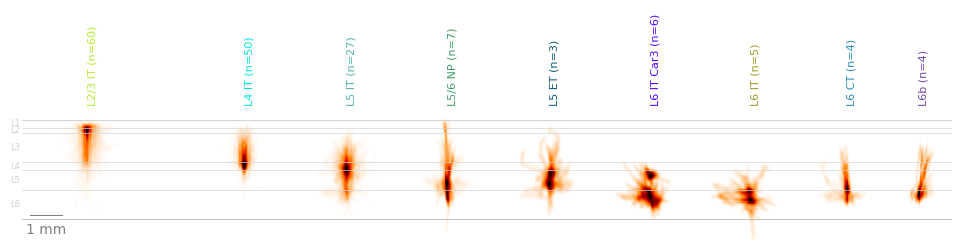

<Figure size 640x480 with 0 Axes>

In [16]:
fig_name = 'human_excitatory_axon_density_bySubclass_kde_nbins{}.pdf'.format(nbins)
layer_label_font_size = 6
xbuffer = 300
group_title_start_height=500
group_title_font_size=8

x_var_order = group_order['subclass_label']

fig_path = os.path.join(output_dir, fig_name)
with PdfPages(fig_path) as pdf:
    with warnings.catch_warnings(): 
        warnings.simplefilter(action='ignore', category=FutureWarning)

        fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(12, 12), sharex=True, sharey=True)

        for l in layer_info: ax.axhline(-layer_info[l], c=layer_colors[l],linewidth=0.50)
        for l in layer_labels: ax.text(-100,-layer_labels[l], "{}".format(l),verticalalignment='center', horizontalalignment='left',fontsize=layer_label_font_size, color='lightgrey') 
        
        # plot
        xoffset= 0
        # for i, subclass in enumerate(list(kde_group_dict.keys())):
        for i, subclass in enumerate([x for x in x_var_order if x in kde_group_dict.keys()]):

            this_xi = kde_group_dict[subclass]['xi']
            this_yi = kde_group_dict[subclass]['yi']
            this_zi = kde_group_dict[subclass]['zi']
            this_num_cells = kde_group_dict[subclass]['num_cells']

            left_width = np.abs(np.min(this_xi))
            right_width = np.max(this_xi)

            xoffset += xbuffer + left_width
            this_xi = this_xi + xoffset

            plt.pcolormesh(this_xi, this_yi, this_zi.reshape(this_xi.shape), shading='auto', cmap='gist_heat_r') #'magma'
            plt.gca().set_aspect('equal')

            ax.axis('off')
            ax.axhline(0, c="lightgrey",linewidth=0.50)

            #save label 
            ax.text(xoffset,group_title_start_height,
                "{} (n={}) ".format(subclass,this_num_cells),
                horizontalalignment='left',fontsize=group_title_font_size, color=color_dict[subclass], rotation=90)

            if i == 0:
                #add a scale bar 
                scalebar = ScaleBar(1, "um", location='lower left', frameon=False, length_fraction=0.05, color = 'grey')
                ax.add_artist(scalebar)
            
            xoffset += right_width

        pdf.savefig(dpi=600, bbox_inches='tight')
    plt.show()
    plt.clf()


In [17]:
# axon density x t-type
group_var_name = 't_type'
groups = group_order[group_var_name]
kde_group_dict_ttype = {}
xbuffer=500
for group in groups:
    print(group)

    x = []
    y = []

    #0) get cells to plot 
    swc_list = sorted_clean_data[sorted_clean_data[group_var_name] == group]['SWC_layer_aligned']
    num_cells = len(swc_list)

    if num_cells == 0: continue
    for swc in swc_list:

        #1) get a nrn
        nrn = morphology_from_swc(swc)

        #3) append x,y axon node vals
        axon_nodes = nrn.get_node_by_types(node_types=[AXON])
        for n in axon_nodes:
            x.append(n['x'])
            y.append(n['y'])

    x = np.array(x)
    y = np.array(y)

    # Evaluate a gaussian kde on a regular grid of nbins x nbins over data extents
    nbins=100 #300
    k = kde.gaussian_kde([x,y])
    # xi, yi = np.mgrid[x.min():x.max():nbins*1j, y.min():y.max():nbins*1j]
    # xi, yi = np.mgrid[x.min():x.max():nbins*1j, -layer_info['wm']:layer_info['1']:nbins*1j] #kde over the full cortical depth (pia to wm) even if no axon at superficial/deep ends
    y_min = min(y.min(), -layer_info['wm'])
    y_max = max(y.max(), layer_info['1'])
    x_min = x.min() - xbuffer
    x_max = x.max() + xbuffer 
    xi, yi = np.mgrid[x_min:x_max:nbins*1j, y_min:y_max:nbins*1j] #kde over the full cortical depth (pia to wm) even if no axon at superficial/deep ends

    zi = k(np.vstack([xi.flatten(), yi.flatten()]))

    #save this kde to group
    kde_group_dict_ttype[group] = {'x':x, 'y':y, 'k':k, 'xi':xi, 'yi':yi, 'zi':zi, 'num_cells': num_cells}  


#save kde_group_dict
with open(os.path.join(output_dir, "heatmap_kde_ttype_axon.pkl"), "wb") as f:
    pickle.dump(kde_group_dict, f)

L2 IT_6


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L2 IT_1


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L2 IT_7


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L2 IT_2


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L3 IT_8


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L3 IT_12


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L3 IT_10


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L3 IT_13


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L3 IT_5


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L3 IT_3


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L4 IT_3


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L4 IT_4


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L4 IT_2


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L4 IT_1


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L5 IT_6


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L5 IT_5


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L5 IT_2


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L5 IT_1


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L5 IT_7


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L5 IT_3


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L5/6 NP_2


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L5/6 NP_6
L5/6 NP_1


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L5/6 NP_3
L5/6 NP_4


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L5 ET_1
L5 ET_2


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L5 ET(ME)


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L6 IT Car3_1


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L6 IT Car3_3


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L6 IT Car3_2
L6 IT_2


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L6 IT_1


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L6 CT_3


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L6 CT_2


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L6 CT_4
L6 CT_1


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L6b_6


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L6b_3


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L6b_5


C:\Users\sarah.wallingbell\AppData\Local\Temp\ipykernel_28468\3315191251.py:33: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([x,y])


L6b_1
L6b_4
L6b_2


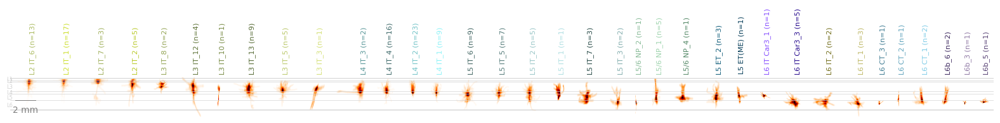

<Figure size 640x480 with 0 Axes>

In [18]:
fig_name = 'human_excitatory_axon_density_byTtype_kde_nbins{}.pdf'.format(nbins)
layer_label_font_size = 6
xbuffer = 300
group_title_start_height=500
group_title_font_size=8

x_var_order = group_order['t_type']

fig_path = os.path.join(output_dir, fig_name)
with PdfPages(fig_path) as pdf:
    with warnings.catch_warnings(): 
        warnings.simplefilter(action='ignore', category=FutureWarning)

        fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(20,20), sharex=True, sharey=True)

        for l in layer_info: ax.axhline(-layer_info[l], c=layer_colors[l],linewidth=0.50)
        for l in layer_labels: ax.text(-100,-layer_labels[l], "{}".format(l),verticalalignment='center', horizontalalignment='left',fontsize=layer_label_font_size, color='lightgrey') 
        
        # plot
        xoffset= 0
        # for i, ttype in enumerate(list(kde_group_dict_ttype.keys())):
        for i, ttype in enumerate([x for x in x_var_order if x in kde_group_dict_ttype.keys()]):

            this_xi = kde_group_dict_ttype[ttype]['xi']
            this_yi = kde_group_dict_ttype[ttype]['yi']
            this_zi = kde_group_dict_ttype[ttype]['zi']
            this_num_cells = kde_group_dict_ttype[ttype]['num_cells']

            left_width = np.abs(np.min(this_xi))
            right_width = np.max(this_xi)

            xoffset += xbuffer + left_width
            this_xi = this_xi + xoffset

            plt.pcolormesh(this_xi, this_yi, this_zi.reshape(this_xi.shape), shading='auto', cmap='gist_heat_r') #'magma'
            plt.gca().set_aspect('equal')

            ax.axis('off')
            ax.axhline(0, c="lightgrey",linewidth=0.50)

            #save label 
            ax.text(xoffset,group_title_start_height,
                "{} (n={}) ".format(ttype,this_num_cells),
                horizontalalignment='left',fontsize=group_title_font_size, color=color_dict[ttype], rotation=90)

            if i == 0:
                #add a scale bar 
                scalebar = ScaleBar(1, "um", location='lower left', frameon=False, length_fraction=0.05, color = 'grey')
                ax.add_artist(scalebar)
            
            xoffset += right_width

        pdf.savefig(dpi=600, bbox_inches='tight')
    plt.show()
    plt.clf()
